In [1]:
#Data processing
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from nptdms import TdmsFile #Process ramping file

#For building ML models
import keras
import keras.models as models
from keras.layers.core import Dense
from keras import regularizers
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from scipy.signal import find_peaks

np.random.seed(1337) # for reproducibility


Bad key "text.kerning_factor" on line 4 in
/uscms_data/d3/dhoang/miniconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution
Using TensorFlow backend.


In [6]:
def load_sensor(dir_path, sensor, time_range = None):
    
    data = pd.DataFrame(data = {sensor: np.load(dir_path + sensor + ".npy"),
                                "time": np.load(dir_path + "time.npy")})
    
    start = min(data["time"])
    end = max(data["time"])
    
    if time_range:
        start = time_range[0]
        end = time_range[1]
    
    
    data = data[(data["time"] > start) & (data["time"] < end)]
   
    %reset -f in
    
    return data[sensor]

def load_time_label(dir_path, time_range, window = 2000, step = 10):
    
    time_label =  np.load(dir_path + "time.npy")
    
    start = min(time_label)
    end = max(time_label)
    
    if time_range:
        start = time_range[0]
        end = time_range[1]
    
    
    time_label = time_label[(time_label > start) & (time_label < end)][window-1::step]
    
    %reset -f in
    
    return time_label

#### Mean of abs(signal)
def generate_mean_data(dir_path, time_range, window = 2000, step = 10):
    #Load the data
    ai0 = load_sensor(dir_path, "ai0", time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    ai1 = load_sensor(dir_path, "ai1", time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    ai2 = load_sensor(dir_path, "ai2", time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    ai3 = load_sensor(dir_path, "ai3", time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    ai4 = load_sensor(dir_path, "ai4", time_range = time_range).abs().rolling(window=window).mean().to_numpy()[window-1::step]
    
    #Calculate the product
    product = ai0*ai1*ai2*ai3*ai4
    
    #Stack them together
    all_mean = np.vstack((ai0,ai1,ai2,ai3,ai4, product)).transpose()
    
    %reset -f in
    
    return all_mean

#### SD of signal
def generate_sd_data(dir_path, time_range, window = 2000, step = 10):
    #Load the data
    ai0 = load_sensor(dir_path, "ai0", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai1 = load_sensor(dir_path, "ai1", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai2 = load_sensor(dir_path, "ai2", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai3 = load_sensor(dir_path, "ai3", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    ai4 = load_sensor(dir_path, "ai4", time_range = time_range).rolling(window=window).std().to_numpy()[window-1::step]
    
    #Calculate the product
    product = ai0*ai1*ai2*ai3*ai4
    
    #Stack them together
    all_sd = np.vstack((ai0,ai1,ai2,ai3,ai4, product)).transpose()
    
    %reset -f in
    
    return all_sd

#### Thresholded zero crossings
def zero_crossings(array):
    
    #Set values outside of range (0.001, 0.1) = 0
    array[abs(array) > 0.1] = 0
    array[abs(array) < 0.005] = 0
    
    #Calculate number of zero-crossing points, normalized by the window size
    zero_crossings = ((array[:-1] * array[1:]) < 0).sum()/array.size
    
    return zero_crossings


def generate_crossings_data(dir_path, time_range = None, window = 5000, step = 10):
    
    #Load the data
    ai0 = load_sensor(dir_path, "ai0", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    ai1 = load_sensor(dir_path, "ai1", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    ai2 = load_sensor(dir_path, "ai2", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    ai3 = load_sensor(dir_path, "ai3", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    ai4 = load_sensor(dir_path, "ai4", time_range = time_range).rolling(window=window).apply(zero_crossings, raw = True).to_numpy()[window-1::step]
    
    product = ai0*ai1*ai2*ai3*ai4
    
    #Stack them together
    all_crossings = np.vstack((ai0,ai1,ai2,ai3,ai4, product)).transpose()
    
    %reset -f in
    
    return all_crossings

def load_thres_product(dir_path, time_range):
    #load time axis
    time_axis = load_time_label(dir_path, time_range = (-200,0), window = 25000, step = 10)
    
    #Load data
    product_data = np.load(dir_path+"cross-product.npy")
    
    #return the data in time_range
    selection_index = (time_axis > time_range[0]) & (time_axis < time_range[1]) 
    %reset -f in
    
    return product_data[selection_index][:, np.newaxis]


def generate_data(dir_path, time_range, window = 2000, step = 10):
    
    #Selection index due to using different window
    #selection_index = int((thres_win - window)/step)
    
    moving_mean = generate_mean_data(dir_path, time_range, window = window, step = step) ##!!!!!! CAREFUL
    moving_sd = generate_sd_data(dir_path, time_range, window = window, step = step)
    time_label = load_time_label(dir_path, time_range, window = window, step = step)
    moving_thres_crossings = load_thres_product(dir_path, time_range = (time_label.min() - 1e-4, time_label.max()))
    
    
    all_data = np.concatenate((moving_mean, moving_sd, moving_thres_crossings**1.5), axis = 1)
    
    print("All data's shape: ", all_data.shape)
    
    plt.figure(figsize=(20,2))
    plt.plot(all_data[:,12])
    
    %reset -f in
    
    return all_data, time_label

#####-------INCREMENTAL LEARNING IMPLEMENTATION-------######

def create_model():
    
    #================BUILD THE MODEL====================
    # Simple model
    # Simple model
    model = models.Sequential()

    model.add(Dense(6, activation = 'elu', kernel_initializer='glorot_uniform',
                    kernel_regularizer=regularizers.l2(0.0),
                    input_dim=13))

    model.add(Dense(3,activation='elu',
                    kernel_initializer='glorot_uniform'))

    model.add(Dense(6,activation='elu',
                    kernel_initializer='glorot_uniform'))

    model.add(Dense(13,
                    kernel_initializer='glorot_uniform'))

    model.compile(loss='mse',optimizer='adam')


    return model

def train(current_weights, X, time_axis, time_range):
    """Take a model, train it in the appropritate time range, return the new weights
    and its reconstruction loss distribution"""
    
    print("Training for section: ", time_range)
    #Select the appropriate time
    start_index = None
    
    if time_range[0] is not None:
        start_index = np.argmax(time_axis > time_range[0])
    else:
        start_index = 0
    
    if time_range[1] == 0:
        end_index = None
    else:
        end_index = np.argmax(time_axis > time_range[1])
    
    X_train = np.copy(X[start_index:end_index])
    time_train = time_axis[start_index:end_index]
    
    #Create model
    model = create_model()
    
    if current_weights:
        model.set_weights(current_weights)
    
    #Scaler initiation
    scaler = MinMaxScaler()
    scaler.fit(X_train)
    X_train = scaler.transform(X_train)
    
    X_train[:,12] = X_train[:,12]*6 #More importance in product of zero-crossings
    
    #Train the model and extract new weights
    model.fit(X_train, X_train,
              batch_size=2000,
              epochs=30, verbose = 0)
    
    new_weights = model.get_weights()
    
    #Evaluate the losses and update the distribution
    X_pred = model.predict(X_train)
    loss = np.mean(np.abs(X_pred-X_train), axis = 1)
    
    #Plot the reconstruction loss
    plt.figure(figsize=(20,2))
    plt.plot(time_train, loss)
    plt.title("TRAINING reconstruction loss on {}".format(time_range))
    plt.xlabel("Time [s]")
    plt.show()
    
    #Take the mean of the log loss and update the mean threshold
    current_median = np.median(np.log10(loss))
    
    print("Finished training, median of the log(loss) is: ", current_median)
    
    return new_weights, current_median, scaler

def trigger(current_weights, X, time_axis, time_range, prev_median, scaler):
    
    print("Triggering for section: ", time_range)
    print("Using this median for triggering:", prev_median)
    
    #Select the appropriate time
    start_index = None
    
    if time_range[0] is not None:
        start_index = np.argmax(time_axis > time_range[0])
    else:
        start_index = 0
    
    if time_range[1] == 0:
        end_index = None
    else:
        end_index = np.argmax(time_axis > time_range[1])
    
    time_test = time_axis[start_index:end_index]
    X_test = np.copy(X[start_index:end_index])
    
    X_test = scaler.transform(X_test) #Scale the current data
    X_test[:,12] = X_test[:,12]*6 #Put more importance on the product of zero crossings
    
    #Create model
    model = create_model()
    model.set_weights(current_weights)
        
    #Find the test loss (doing this in parallel for the sake of simulation), but in a practical system
    #Ideally we need to do inference every single data point come in
    X_pred_test = model.predict(X_test)
    test_loss = np.mean(np.abs(X_pred_test-X_test), axis = 1)
    
    
    #Plot the reconstruction loss just to check
    plt.figure(figsize=(20,2))
    plt.plot(time_test, test_loss)
    plt.title("Reconstruction loss on {}".format(time_range))
    plt.xlabel("Time [s]")
    plt.show()
    
    #Quantify how much each data point is far away from the distribution
    log_test_loss = np.log10(test_loss) - prev_median
    
    #Find the trigger time
    trigger_index = np.argmax(log_test_loss > 3)
    
    if  trigger_index != 0:
        #Plot the triggered time
        plt.figure(figsize=(20,2))
        plt.plot(time_test, log_test_loss, color = "firebrick")
        plt.title("Log reconstruction loss on {}".format(time_range))
        plt.xlabel("Time [s]")
        
        #Trigger time
        plt.vlines(time_test[trigger_index], log_test_loss.min(), log_test_loss.max(), color = "blue", linestyles = "dashed", label = "Trigger time")
        plt.legend(loc = "upper left")
        
        
        ### Find trigger times
        peaks, _ = find_peaks(log_test_loss, height=3, distance = 5000)
        print("Other trigger time: ", time_test[peaks])
        print("Their log loss values are: ", log_test_loss[peaks])
        
        for i in range(len(peaks)):
            plt.vlines(time_test[peaks[i]], log_test_loss.min(), log_test_loss.max(), color = "blue", linestyles = "dashed")
            
        plt.show()
        
        return list(time_test[peaks])
    
    else:
        return None
    

def simulation(dir_path, section_size, time_range):
    
    #Load data and create the model
    X, time_axis = generate_data(dir_path, time_range = time_range, window = 2000, step = 10)
    
    #For updating model
    current_weights = None
    new_weights = None
    
    #For keeping track of distribution history
    prev_median = None
    updated_median = None
    
    #Keeping track of scaler after training
    past_scaler = None
    
    #Calculate number of sections
    num_section = int(abs(time_range[0])/section_size)
    print("Number of sections:", num_section)
    
    #Keeping log of all the trigger time
    trigger_log = []
    
    #Sequentially go through the data
    for i in range(num_section):
        
        print("Entering sections: ", (-section_size*(num_section - i), -section_size*(num_section - i - 1)))
        print("-------->")
        
        if i == 0:
            continue
        elif i == 1:
            #Train on the first segment
            time_range = (None, -section_size*(num_section - i))
            new_weights, updated_median, new_scaler = train(current_weights, X, time_axis, time_range)
        else:
            
            #Set previous distrubution to the newly trained disttribution
            prev_median = updated_median
            current_scaler = new_scaler
            current_weights = new_weights
            
            #Selecting appropriate time range for training and triggering
            train_time_range = (-section_size*(num_section - i + 1), -section_size*(num_section - i))
            trigger_time_range = (-section_size*(num_section - i), -section_size*(num_section - i - 1))
            
            #Train and predict simutaneously
            new_weights, updated_median, new_scaler = train(current_weights, X, time_axis, train_time_range)
            trigger_time = trigger(current_weights, X, time_axis, trigger_time_range, prev_median, current_scaler)
            
            if trigger_time is not None:
                print("Triggered at: ", trigger_time)
                trigger_log.extend(trigger_time)
        
        print("<--------")
        
    print("Finished simulation, all the triggered times are: ", trigger_log)

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (899800, 13)
Flushing input history
Number of sections: 9
Entering sections:  (-90, -80)
-------->
Entering sections:  (-80, -70)
-------->
Training for section:  (None, -80)


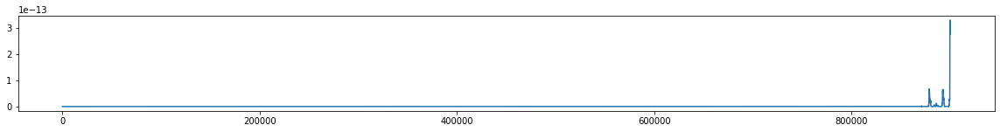

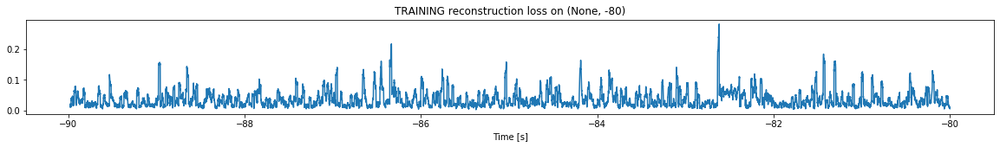

Finished training, median of the log(loss) is:  -1.5299026173015549
<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


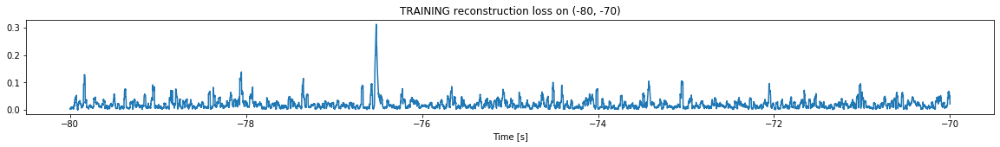

Finished training, median of the log(loss) is:  -1.7796900773094269
Triggering for section:  (-70, -60)
Using this median for triggering: -1.5299026173015549


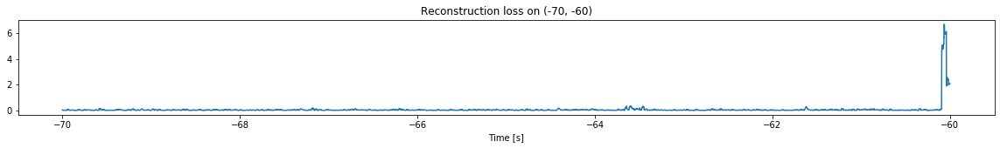

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


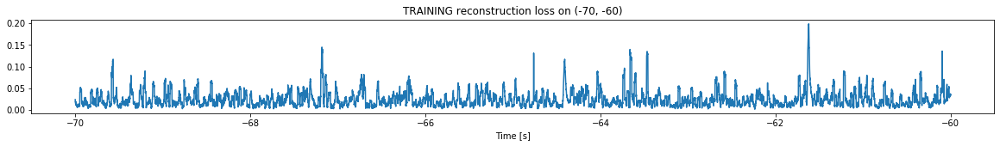

Finished training, median of the log(loss) is:  -1.6885712147904193
Triggering for section:  (-60, -50)
Using this median for triggering: -1.7796900773094269


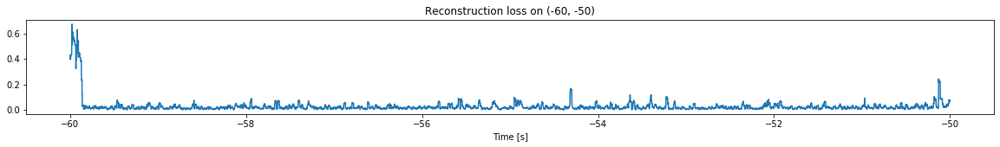

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


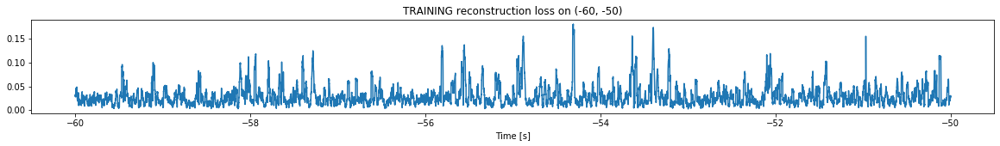

Finished training, median of the log(loss) is:  -1.6148061815396657
Triggering for section:  (-50, -40)
Using this median for triggering: -1.6885712147904193


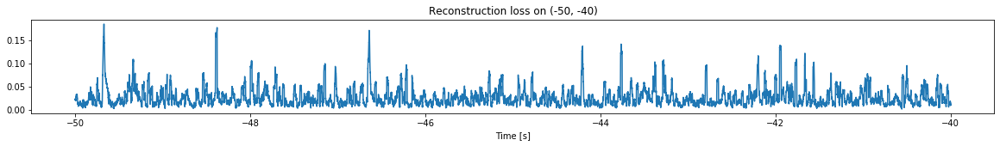

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


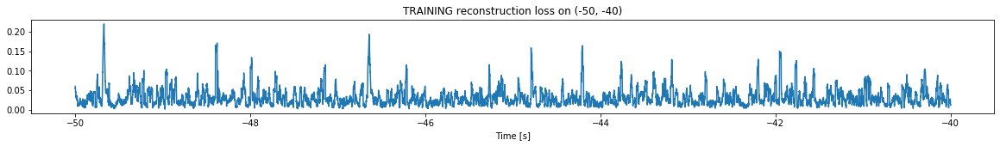

Finished training, median of the log(loss) is:  -1.580645904414098
Triggering for section:  (-40, -30)
Using this median for triggering: -1.6148061815396657


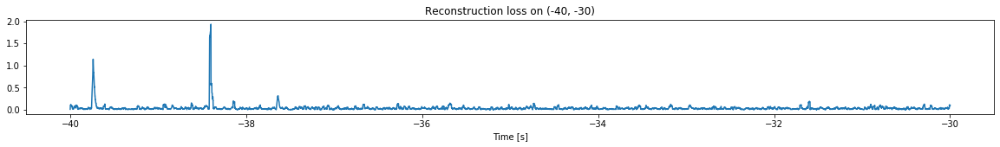

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


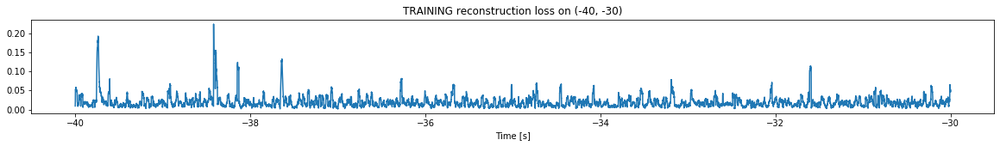

Finished training, median of the log(loss) is:  -1.7973419815932823
Triggering for section:  (-30, -20)
Using this median for triggering: -1.580645904414098


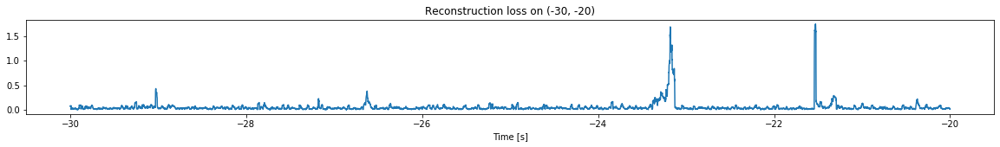

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


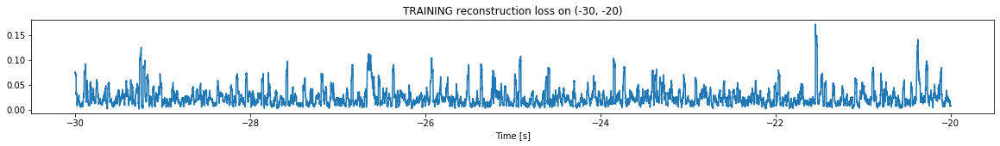

Finished training, median of the log(loss) is:  -1.6702557961641844
Triggering for section:  (-20, -10)
Using this median for triggering: -1.7973419815932823


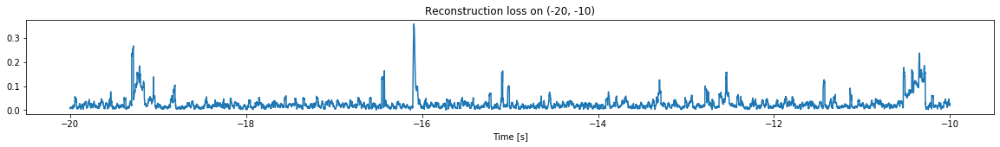

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


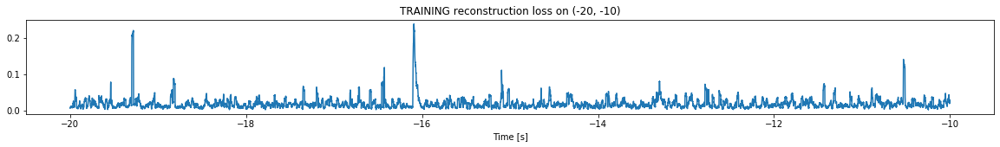

Finished training, median of the log(loss) is:  -1.8096716662631278
Triggering for section:  (-10, 0)
Using this median for triggering: -1.6702557961641844


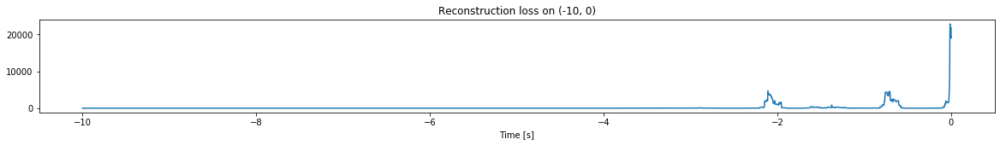

Other trigger time:  [-2.8834999 -2.1095    -1.3736    -0.7039    -0.0115   ]
Their log loss values are:  [3.75786673 5.34148595 4.61110434 5.32401575 6.02939462]


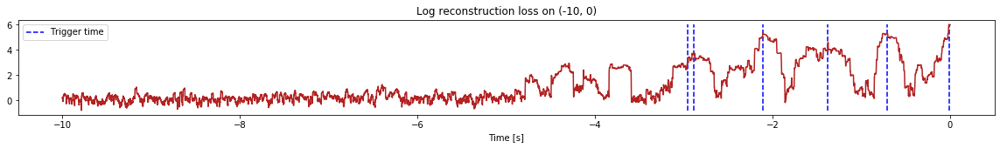

Triggered at:  [-2.8834999, -2.1095, -1.3736, -0.7039, -0.0115]
<--------
Finished simulation, all the triggered times are:  [-2.8834999, -2.1095, -1.3736, -0.7039, -0.0115]


In [7]:
simulation("./data/Ramp4/", 10, (-90,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (899800, 13)
Flushing input history
Number of sections: 9
Entering sections:  (-90, -80)
-------->
Entering sections:  (-80, -70)
-------->
Training for section:  (None, -80)


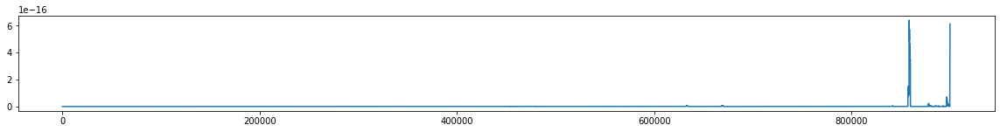

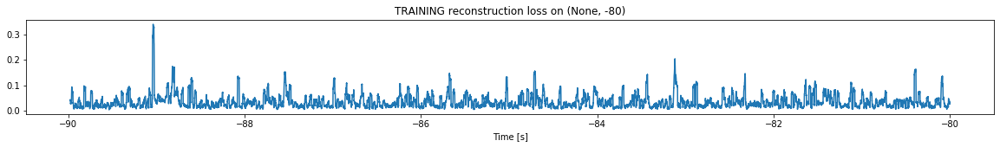

Finished training, median of the log(loss) is:  -1.5480835487321485
<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


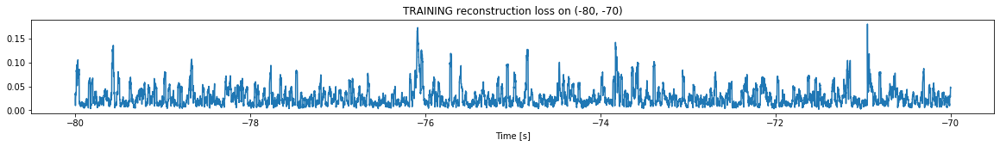

Finished training, median of the log(loss) is:  -1.6689739991434822
Triggering for section:  (-70, -60)
Using this median for triggering: -1.5480835487321485


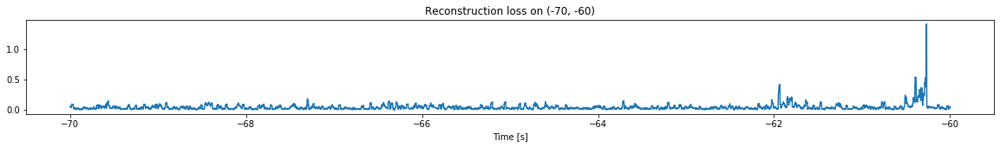

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


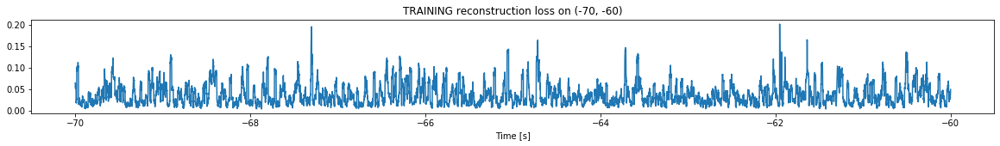

Finished training, median of the log(loss) is:  -1.5118567941094105
Triggering for section:  (-60, -50)
Using this median for triggering: -1.6689739991434822


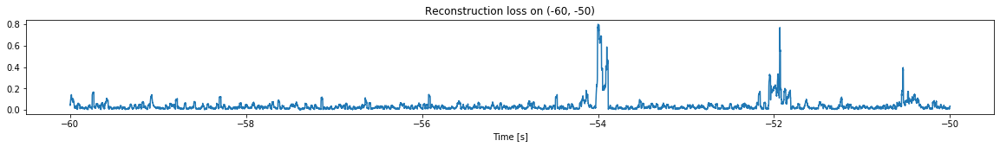

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


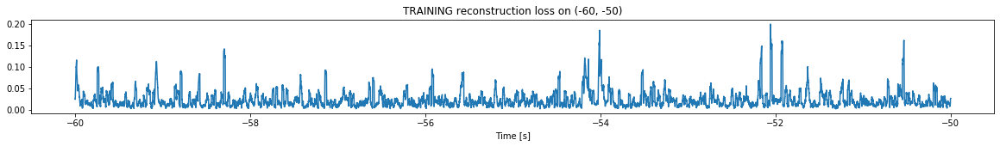

Finished training, median of the log(loss) is:  -1.728913553302653
Triggering for section:  (-50, -40)
Using this median for triggering: -1.5118567941094105


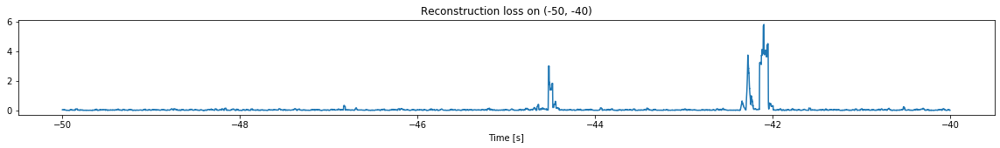

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


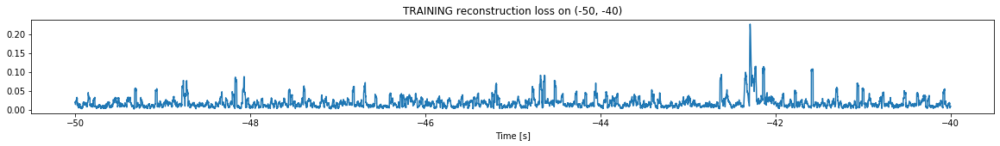

Finished training, median of the log(loss) is:  -1.8386776237899016
Triggering for section:  (-40, -30)
Using this median for triggering: -1.728913553302653


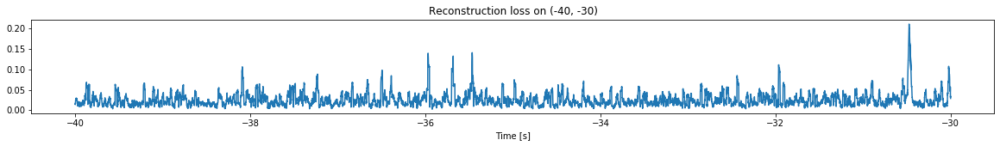

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


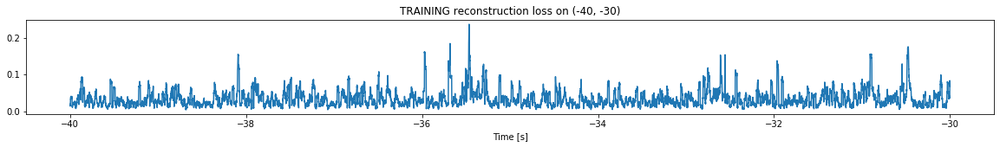

Finished training, median of the log(loss) is:  -1.5328604597814635
Triggering for section:  (-30, -20)
Using this median for triggering: -1.8386776237899016


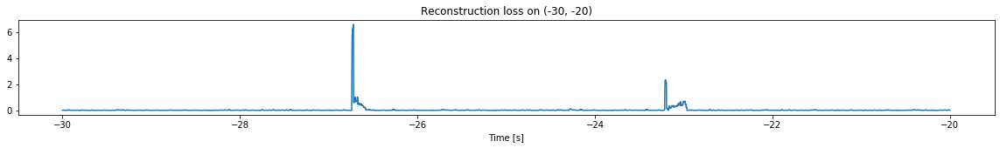

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


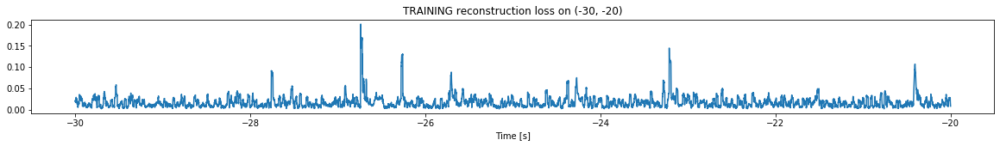

Finished training, median of the log(loss) is:  -1.8280660307146661
Triggering for section:  (-20, -10)
Using this median for triggering: -1.5328604597814635


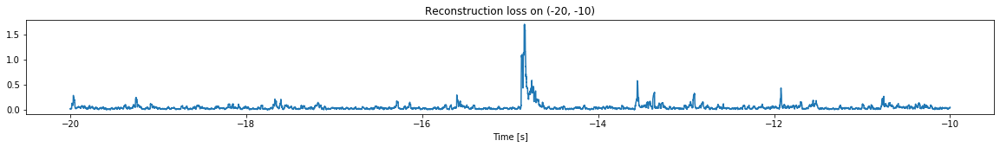

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


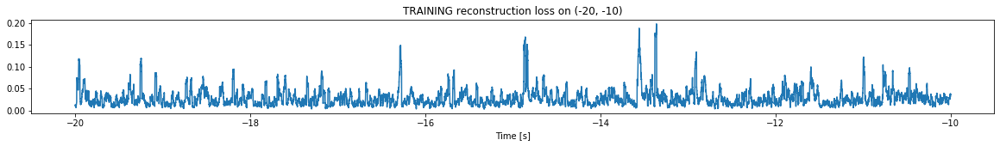

Finished training, median of the log(loss) is:  -1.6118858047640332
Triggering for section:  (-10, 0)
Using this median for triggering: -1.8280660307146661


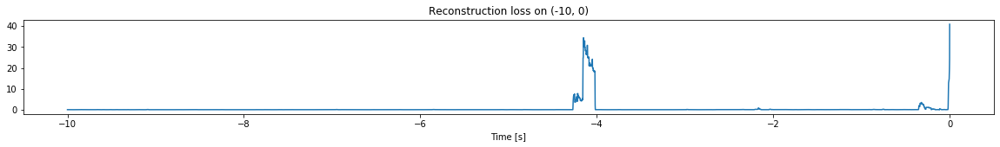

Other trigger time:  [-4.1503997]
Their log loss values are:  [3.36528641]


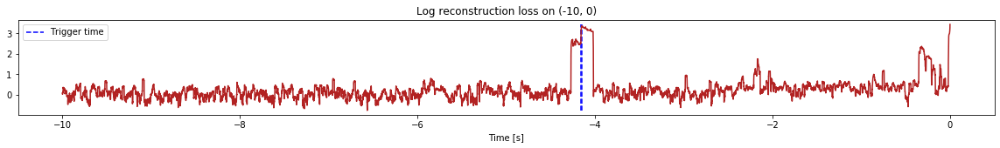

Triggered at:  [-4.1503997]
<--------
Finished simulation, all the triggered times are:  [-4.1503997]


In [8]:
simulation("./data/Ramp5/", 10, (-90,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (999800, 13)
Flushing input history
Number of sections: 10
Entering sections:  (-100, -90)
-------->
Entering sections:  (-90, -80)
-------->
Training for section:  (None, -90)


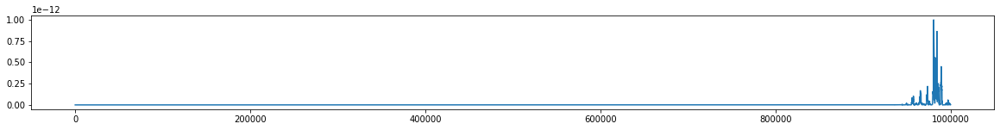

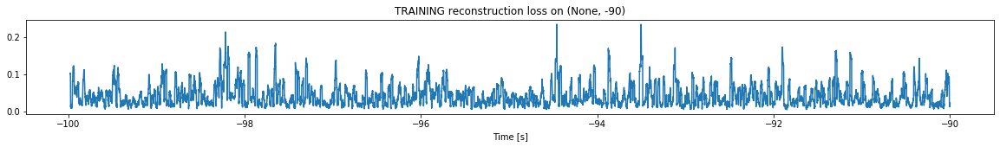

Finished training, median of the log(loss) is:  -1.436751411638078
<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


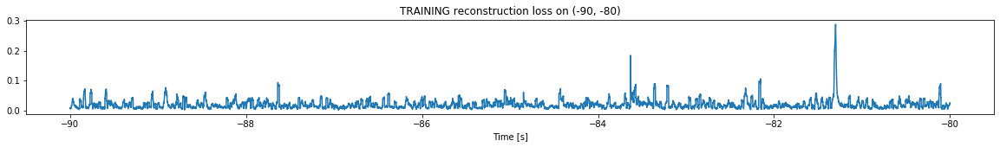

Finished training, median of the log(loss) is:  -1.79737807718225
Triggering for section:  (-80, -70)
Using this median for triggering: -1.436751411638078


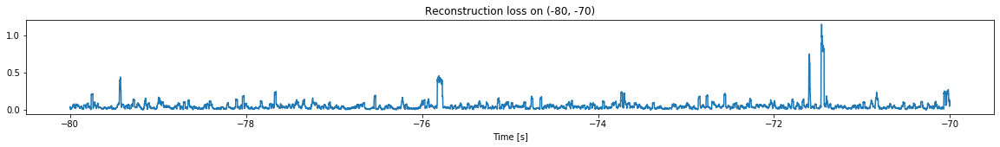

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


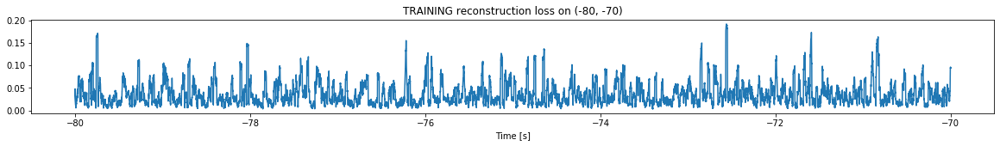

Finished training, median of the log(loss) is:  -1.5219228963576714
Triggering for section:  (-70, -60)
Using this median for triggering: -1.79737807718225


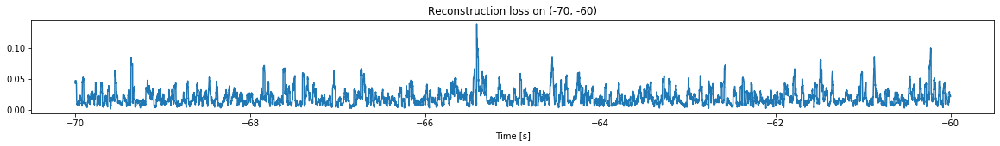

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


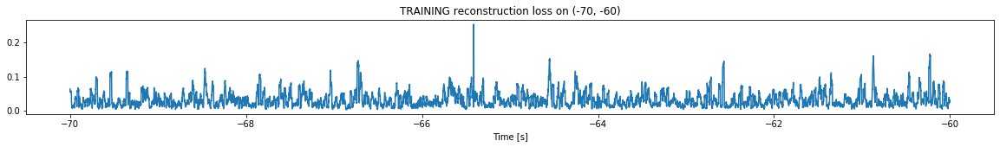

Finished training, median of the log(loss) is:  -1.5536567505713244
Triggering for section:  (-60, -50)
Using this median for triggering: -1.5219228963576714


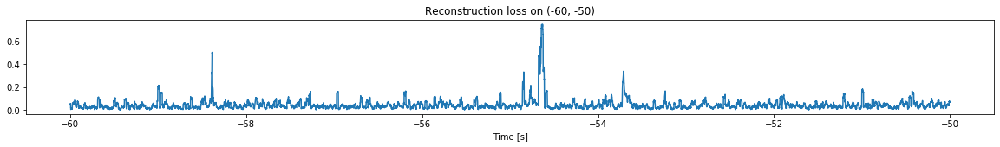

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


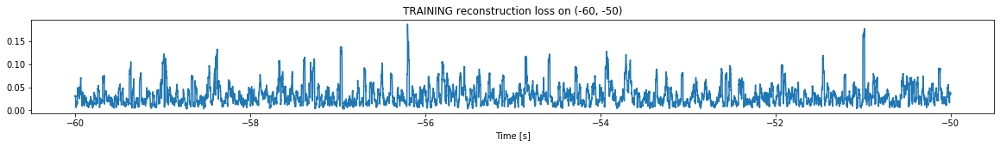

Finished training, median of the log(loss) is:  -1.5714593811022204
Triggering for section:  (-50, -40)
Using this median for triggering: -1.5536567505713244


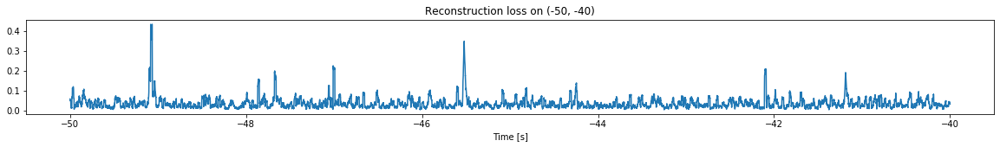

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


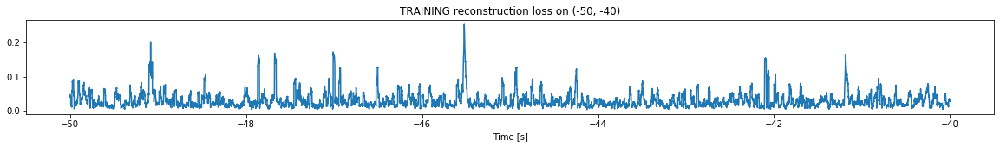

Finished training, median of the log(loss) is:  -1.6347244329327322
Triggering for section:  (-40, -30)
Using this median for triggering: -1.5714593811022204


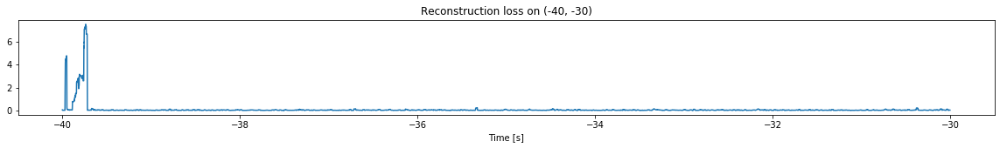

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


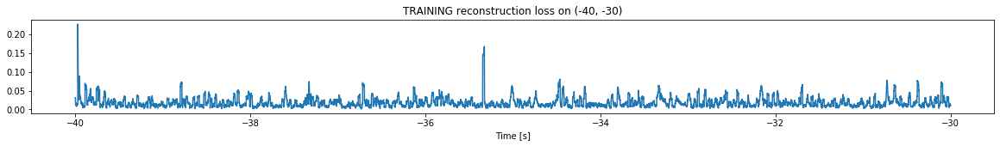

Finished training, median of the log(loss) is:  -1.8193859117943187
Triggering for section:  (-30, -20)
Using this median for triggering: -1.6347244329327322


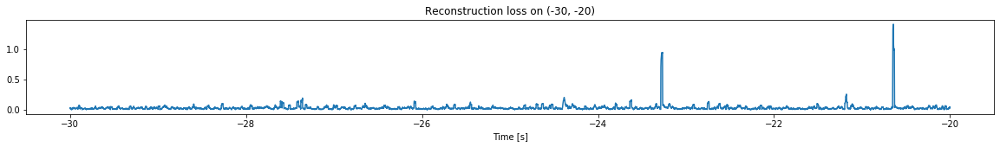

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


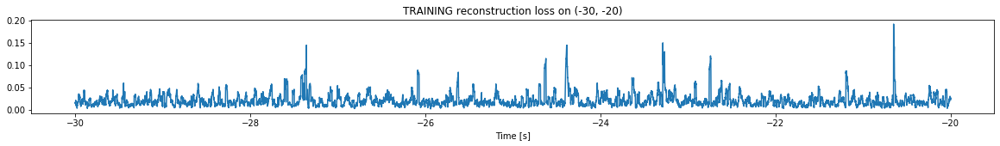

Finished training, median of the log(loss) is:  -1.7619518252553066
Triggering for section:  (-20, -10)
Using this median for triggering: -1.8193859117943187


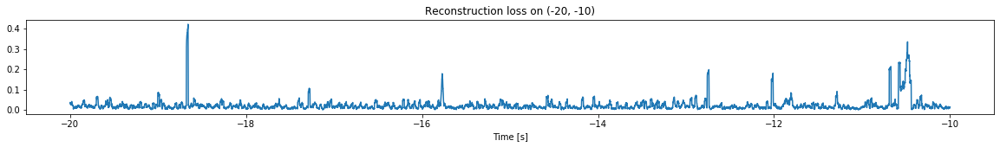

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


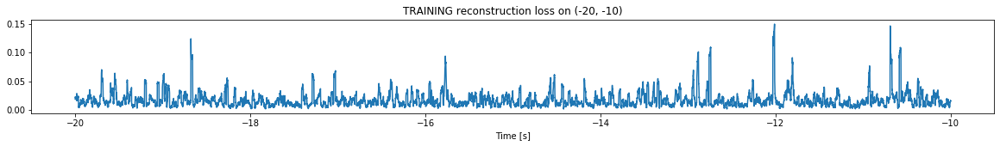

Finished training, median of the log(loss) is:  -1.849016504517563
Triggering for section:  (-10, 0)
Using this median for triggering: -1.7619518252553066


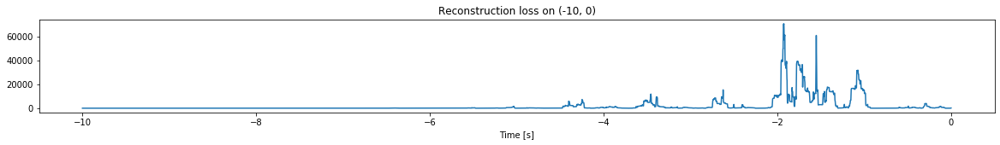

Other trigger time:  [-6.3933997 -5.5516996 -5.0397997 -4.2481    -3.4557998 -2.6244
 -1.9286    -1.0725    -0.2847   ]
Their log loss values are:  [4.000979   4.13089511 4.95218367 5.6262616  5.83585531 5.95017181
 6.61184077 6.26505695 5.35558184]


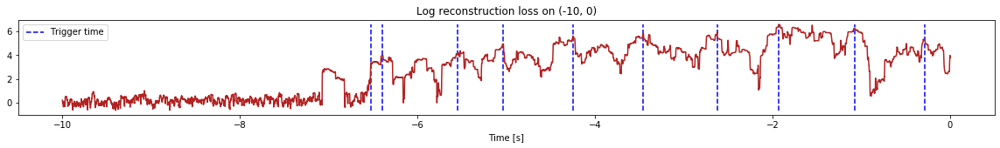

Triggered at:  [-6.3933997, -5.5516996, -5.0397997, -4.2481, -3.4557998, -2.6244, -1.9286, -1.0725, -0.2847]
<--------
Finished simulation, all the triggered times are:  [-6.3933997, -5.5516996, -5.0397997, -4.2481, -3.4557998, -2.6244, -1.9286, -1.0725, -0.2847]


In [10]:
simulation("./data/Ramp12d/", 10, (-100,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (1949800, 13)
Flushing input history
Number of sections: 19
Entering sections:  (-190, -180)
-------->
Entering sections:  (-180, -170)
-------->
Training for section:  (None, -180)


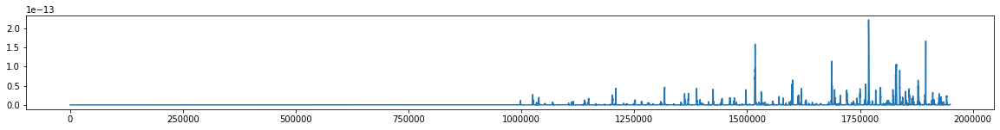

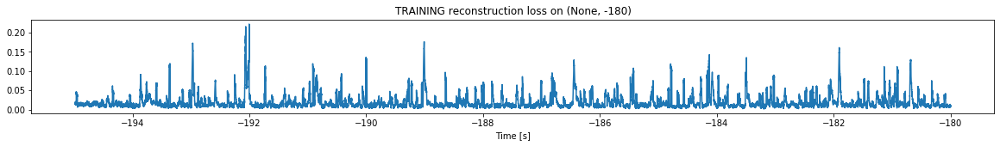

Finished training, median of the log(loss) is:  -1.8769874557829613
<--------
Entering sections:  (-170, -160)
-------->
Training for section:  (-180, -170)


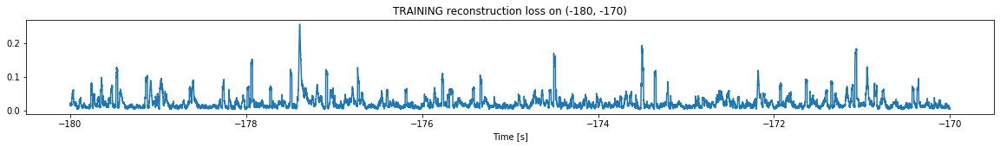

Finished training, median of the log(loss) is:  -1.7600164226945578
Triggering for section:  (-170, -160)
Using this median for triggering: -1.8769874557829613


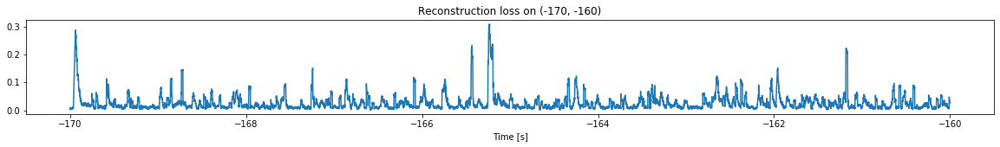

<--------
Entering sections:  (-160, -150)
-------->
Training for section:  (-170, -160)


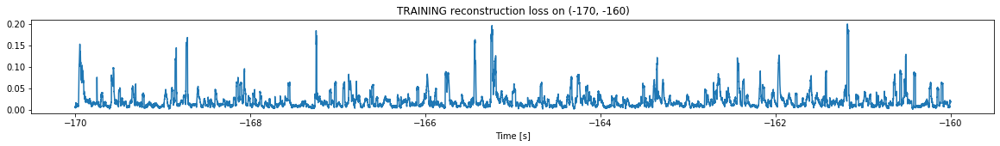

Finished training, median of the log(loss) is:  -1.807130563259238
Triggering for section:  (-160, -150)
Using this median for triggering: -1.7600164226945578


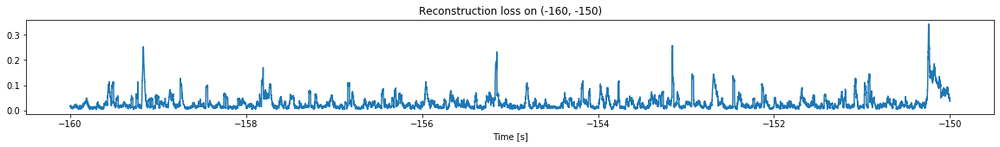

<--------
Entering sections:  (-150, -140)
-------->
Training for section:  (-160, -150)


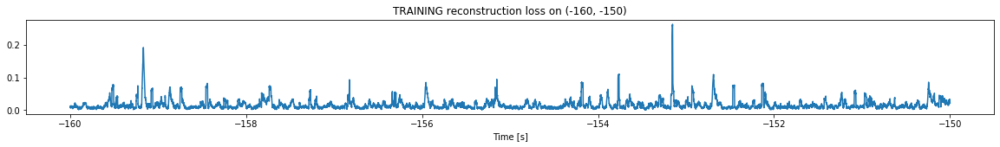

Finished training, median of the log(loss) is:  -1.92134130578727
Triggering for section:  (-150, -140)
Using this median for triggering: -1.807130563259238


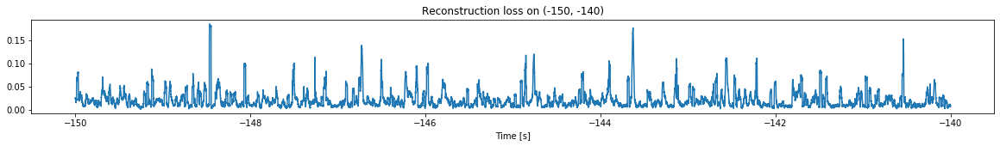

<--------
Entering sections:  (-140, -130)
-------->
Training for section:  (-150, -140)


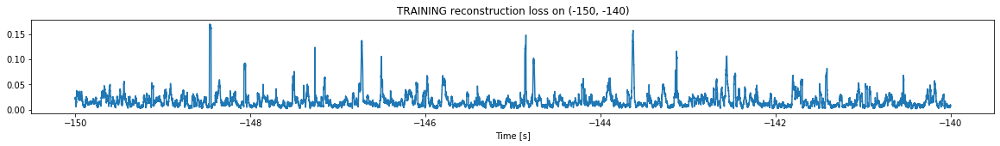

Finished training, median of the log(loss) is:  -1.877764735435119
Triggering for section:  (-140, -130)
Using this median for triggering: -1.92134130578727


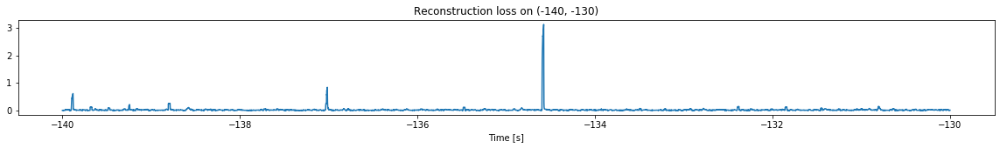

<--------
Entering sections:  (-130, -120)
-------->
Training for section:  (-140, -130)


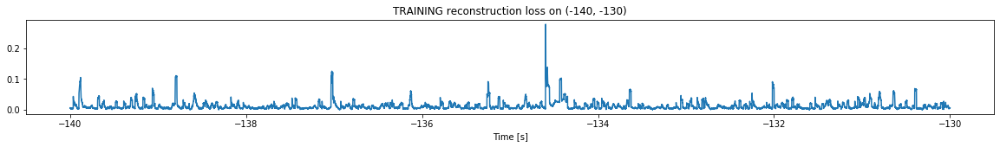

Finished training, median of the log(loss) is:  -2.055954496545308
Triggering for section:  (-130, -120)
Using this median for triggering: -1.877764735435119


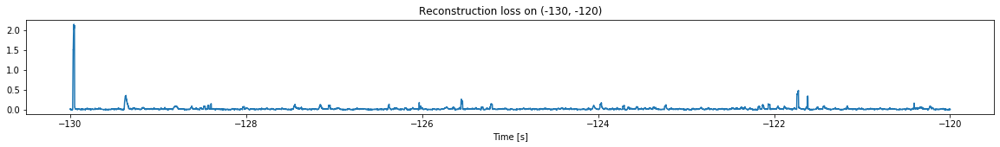

<--------
Entering sections:  (-120, -110)
-------->
Training for section:  (-130, -120)


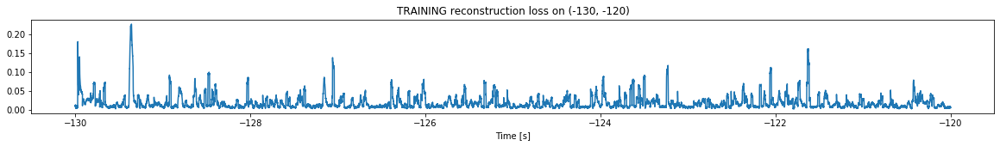

Finished training, median of the log(loss) is:  -1.89225411975029
Triggering for section:  (-120, -110)
Using this median for triggering: -2.055954496545308


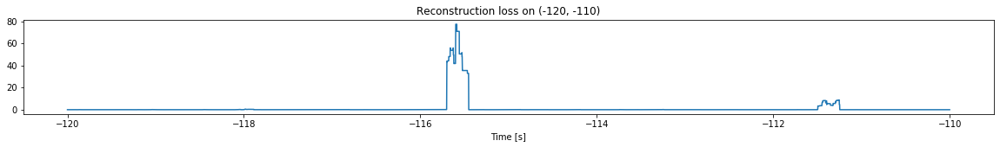

Other trigger time:  [-115.59859 -111.25709]
Their log loss values are:  [3.9438496  3.00025708]


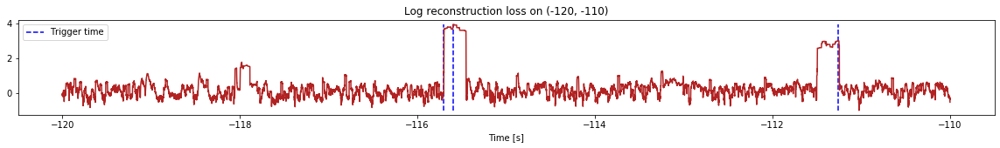

Triggered at:  [-115.59859, -111.25709]
<--------
Entering sections:  (-110, -100)
-------->
Training for section:  (-120, -110)


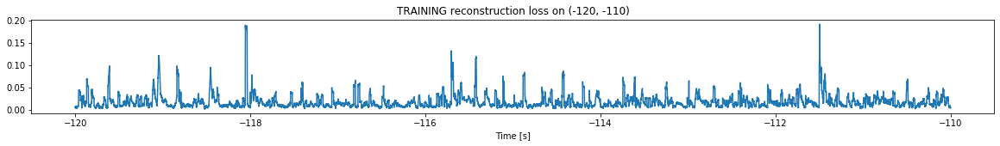

Finished training, median of the log(loss) is:  -1.868973134632659
Triggering for section:  (-110, -100)
Using this median for triggering: -1.89225411975029


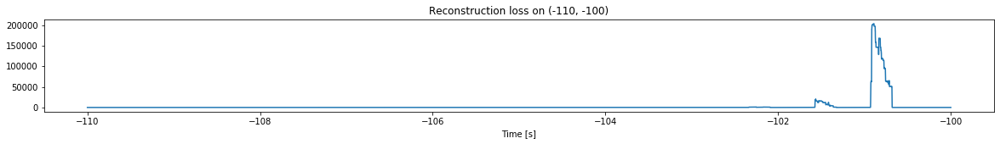

Other trigger time:  [-108.08979  -102.25509  -101.565186 -100.889984 -100.09749 ]
Their log loss values are:  [3.8354975  4.96398873 6.2047128  7.1999623  4.24482003]


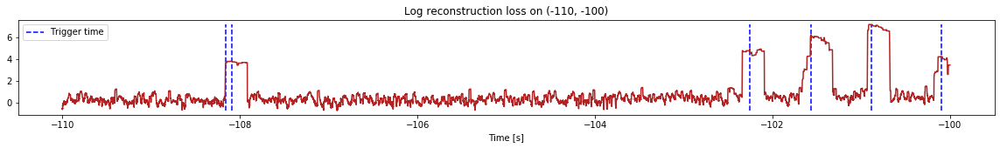

Triggered at:  [-108.08979, -102.25509, -101.565186, -100.889984, -100.09749]
<--------
Entering sections:  (-100, -90)
-------->
Training for section:  (-110, -100)


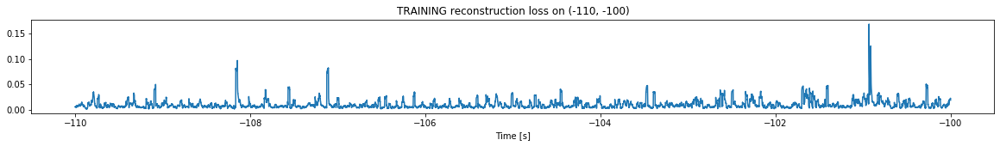

Finished training, median of the log(loss) is:  -2.1274147731816555
Triggering for section:  (-100, -90)
Using this median for triggering: -1.868973134632659


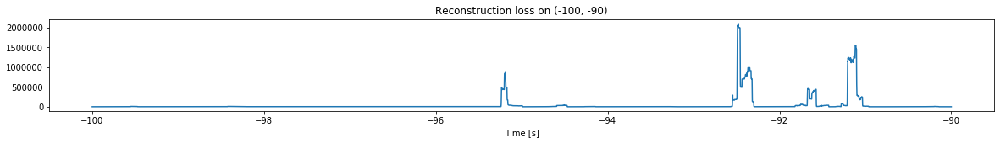

Other trigger time:  [-99.50679  -98.41479  -97.89299  -96.84489  -96.22979  -95.71519
 -95.190384 -94.50299  -93.92869  -93.24859  -92.47909  -91.66909
 -91.113884 -90.178085]
Their log loss values are:  [5.86804733 5.78077277 5.47952949 5.30679641 3.60600195 4.77251189
 7.81647236 6.54014218 5.09245918 5.44929841 8.19224919 7.53101659
 8.05886925 5.76026661]


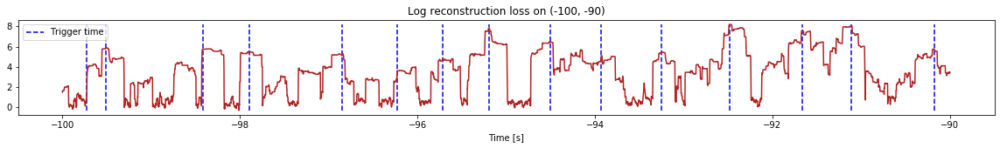

Triggered at:  [-99.50679, -98.41479, -97.89299, -96.84489, -96.22979, -95.71519, -95.190384, -94.50299, -93.92869, -93.24859, -92.47909, -91.66909, -91.113884, -90.178085]
<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


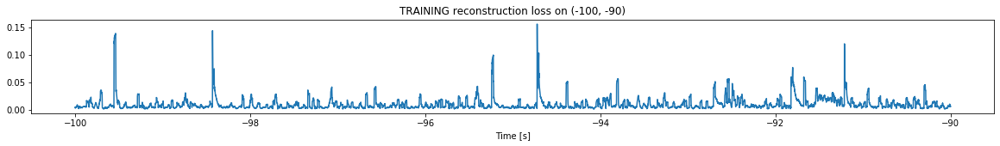

Finished training, median of the log(loss) is:  -2.1846687456625578
Triggering for section:  (-90, -80)
Using this median for triggering: -2.1274147731816555


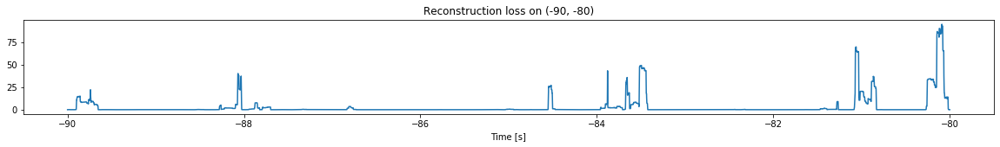

Other trigger time:  [-89.74009  -88.06829  -84.518585 -83.494286 -81.06109  -80.09059 ]
Their log loss values are:  [3.47283851 3.7306543  3.55968701 3.81831316 3.97086361 4.10435898]


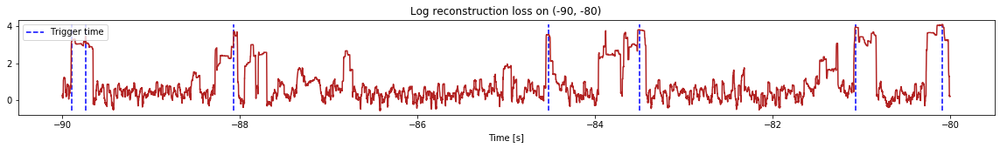

Triggered at:  [-89.74009, -88.06829, -84.518585, -83.494286, -81.06109, -80.09059]
<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


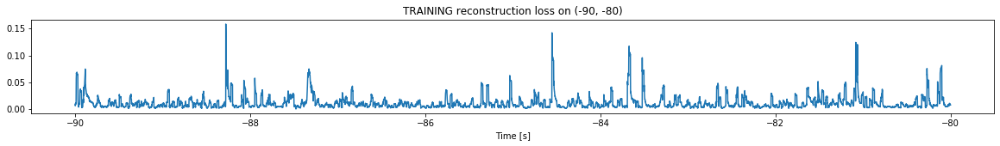

Finished training, median of the log(loss) is:  -2.0696962342632834
Triggering for section:  (-80, -70)
Using this median for triggering: -2.1846687456625578


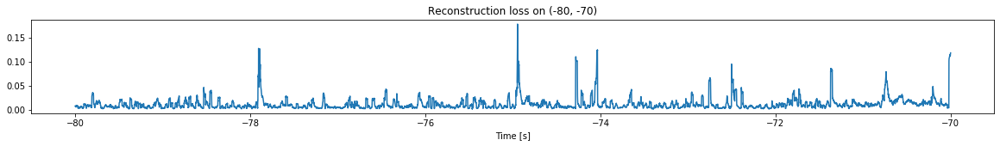

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


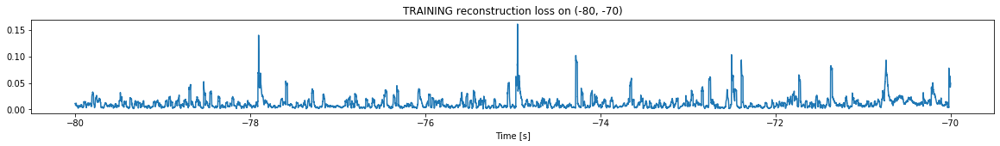

Finished training, median of the log(loss) is:  -2.0706547255562704
Triggering for section:  (-70, -60)
Using this median for triggering: -2.0696962342632834


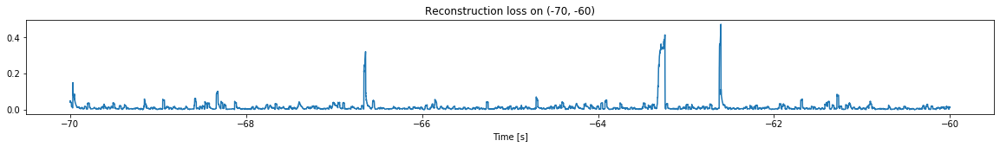

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


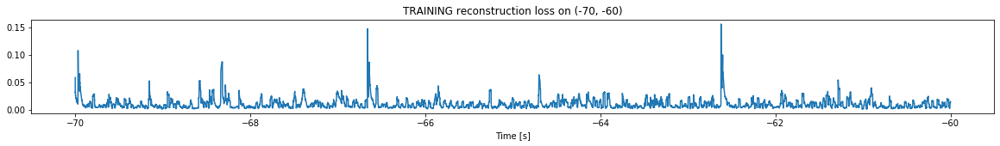

Finished training, median of the log(loss) is:  -2.104834286602376
Triggering for section:  (-60, -50)
Using this median for triggering: -2.0706547255562704


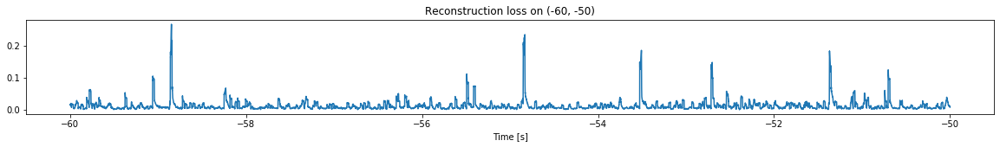

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


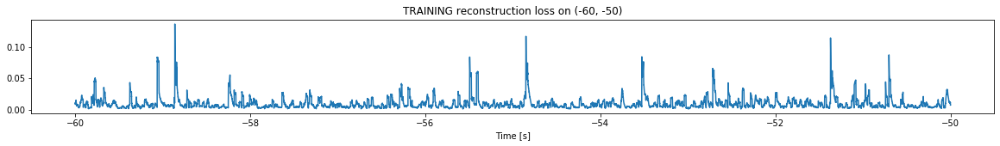

Finished training, median of the log(loss) is:  -2.1421026759333093
Triggering for section:  (-50, -40)
Using this median for triggering: -2.104834286602376


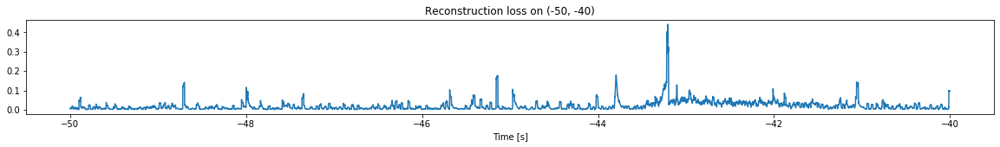

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


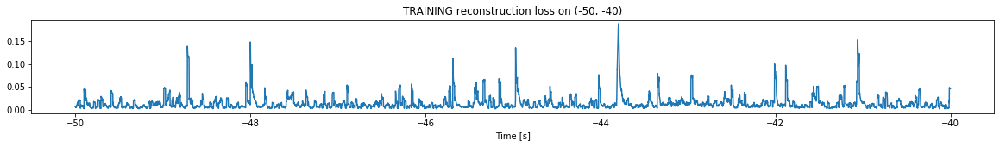

Finished training, median of the log(loss) is:  -1.9960152475514397
Triggering for section:  (-40, -30)
Using this median for triggering: -2.1421026759333093


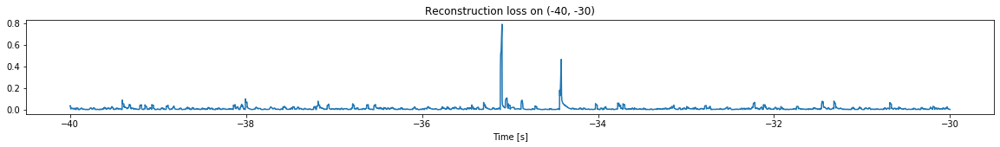

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


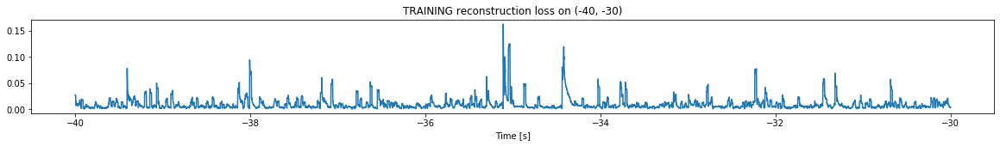

Finished training, median of the log(loss) is:  -2.184402948569349
Triggering for section:  (-30, -20)
Using this median for triggering: -1.9960152475514397


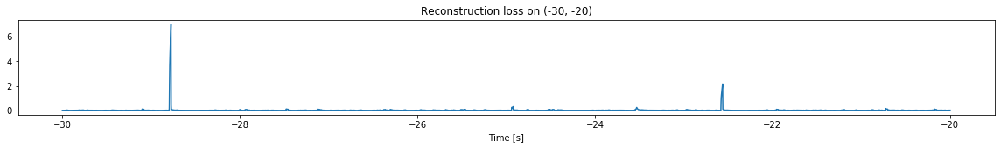

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


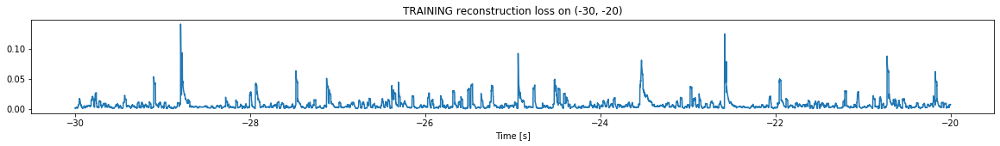

Finished training, median of the log(loss) is:  -2.2933948860329765
Triggering for section:  (-20, -10)
Using this median for triggering: -2.184402948569349


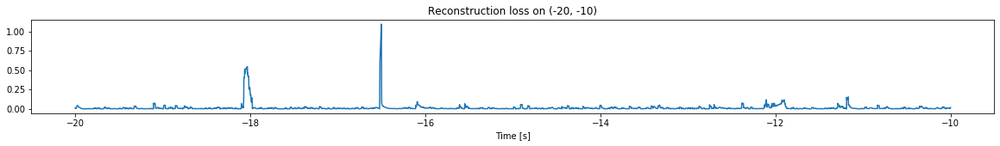

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


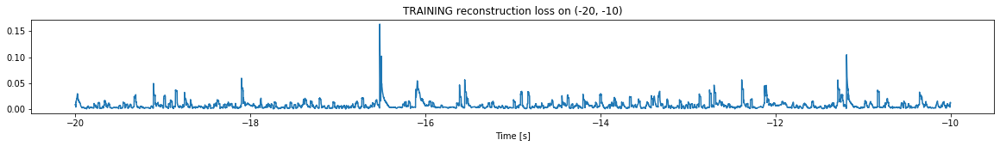

Finished training, median of the log(loss) is:  -2.265412919982858
Triggering for section:  (-10, 0)
Using this median for triggering: -2.2933948860329765


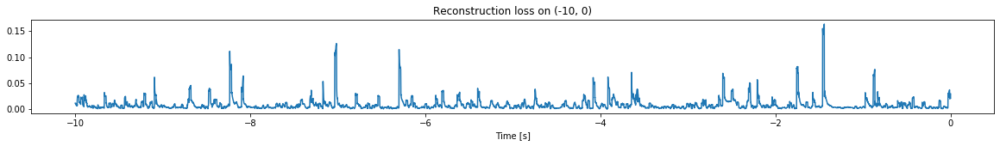

<--------
Finished simulation, all the triggered times are:  [-115.59859, -111.25709, -108.08979, -102.25509, -101.565186, -100.889984, -100.09749, -99.50679, -98.41479, -97.89299, -96.84489, -96.22979, -95.71519, -95.190384, -94.50299, -93.92869, -93.24859, -92.47909, -91.66909, -91.113884, -90.178085, -89.74009, -88.06829, -84.518585, -83.494286, -81.06109, -80.09059]


In [11]:
simulation("./data/Ramp19/", 10, (-195,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (1949800, 13)
Flushing input history
Number of sections: 19
Entering sections:  (-190, -180)
-------->
Entering sections:  (-180, -170)
-------->
Training for section:  (None, -180)


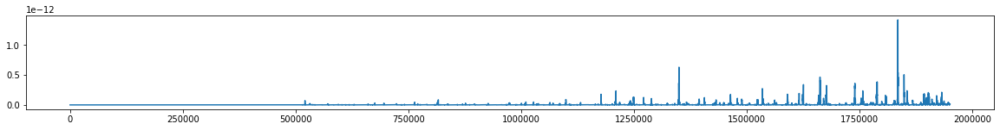

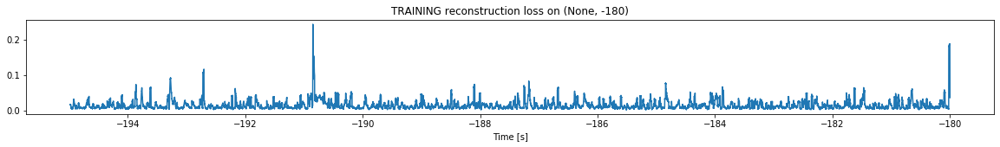

Finished training, median of the log(loss) is:  -1.963494808631009
<--------
Entering sections:  (-170, -160)
-------->
Training for section:  (-180, -170)


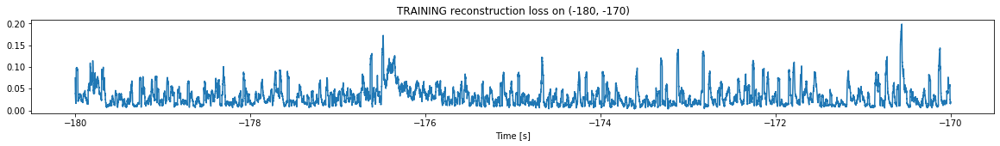

Finished training, median of the log(loss) is:  -1.576225359239504
Triggering for section:  (-170, -160)
Using this median for triggering: -1.963494808631009


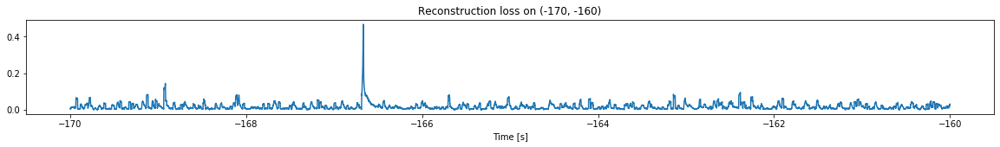

<--------
Entering sections:  (-160, -150)
-------->
Training for section:  (-170, -160)


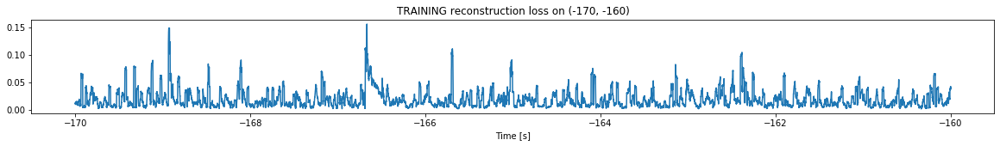

Finished training, median of the log(loss) is:  -1.8286248889777708
Triggering for section:  (-160, -150)
Using this median for triggering: -1.576225359239504


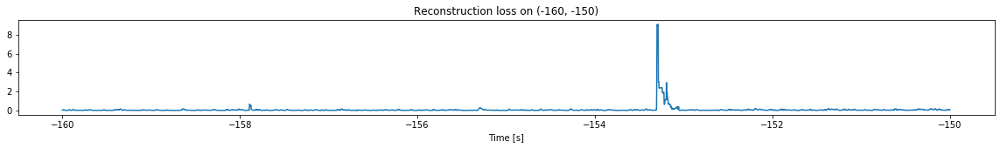

<--------
Entering sections:  (-150, -140)
-------->
Training for section:  (-160, -150)


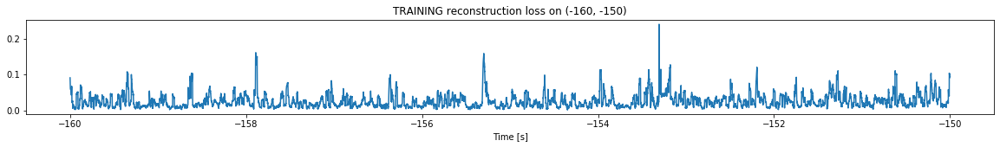

Finished training, median of the log(loss) is:  -1.675496418826353
Triggering for section:  (-150, -140)
Using this median for triggering: -1.8286248889777708


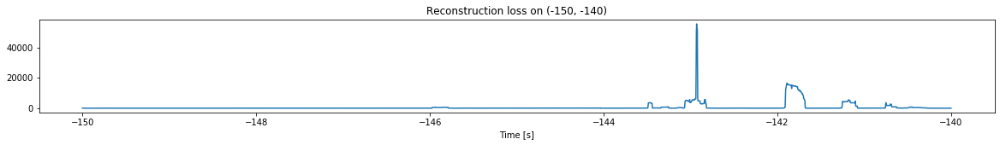

Other trigger time:  [-147.86848 -145.93748 -145.08798 -144.53598 -144.03558 -143.45969
 -142.92929 -142.41728 -141.88719 -141.18478 -140.6361 ]
Their log loss values are:  [3.39043115 4.67484446 3.5294881  3.62101593 4.12494025 5.39215116
 6.57310466 3.78682294 6.04814763 5.56186254 4.80085867]


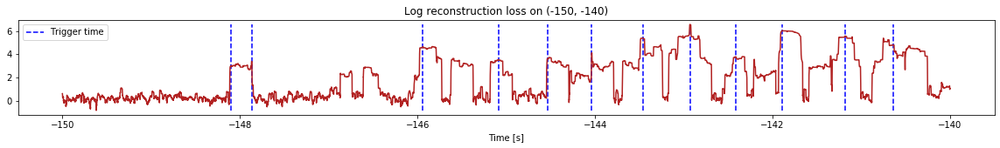

Triggered at:  [-147.86848, -145.93748, -145.08798, -144.53598, -144.03558, -143.45969, -142.92929, -142.41728, -141.88719, -141.18478, -140.6361]
<--------
Entering sections:  (-140, -130)
-------->
Training for section:  (-150, -140)


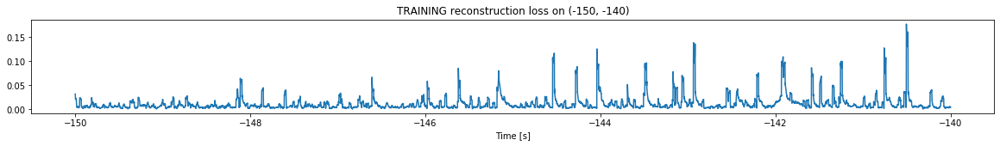

Finished training, median of the log(loss) is:  -2.1250270603578247
Triggering for section:  (-140, -130)
Using this median for triggering: -1.675496418826353


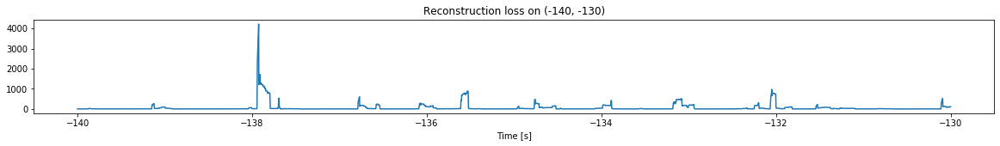

Other trigger time:  [-139.86319 -139.12608 -137.92468 -136.77028 -136.0718  -135.52599
 -134.75859 -133.88739 -133.08589 -132.0474  -131.52489 -130.09099]
Their log loss values are:  [3.10660081 4.09678632 5.30109131 4.45784783 4.14175499 4.62224999
 4.34903309 4.29699882 4.3892393  4.66397859 4.02057012 4.3913378 ]


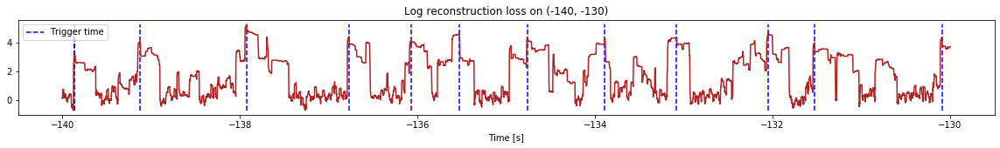

Triggered at:  [-139.86319, -139.12608, -137.92468, -136.77028, -136.0718, -135.52599, -134.75859, -133.88739, -133.08589, -132.0474, -131.52489, -130.09099]
<--------
Entering sections:  (-130, -120)
-------->
Training for section:  (-140, -130)


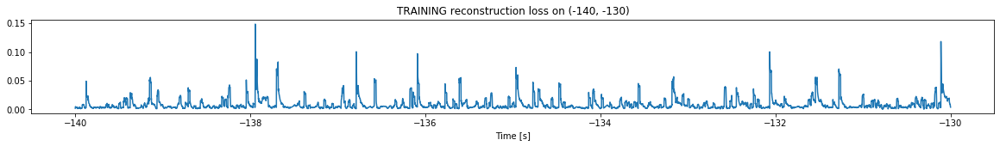

Finished training, median of the log(loss) is:  -2.2607704719105954
Triggering for section:  (-130, -120)
Using this median for triggering: -2.1250270603578247


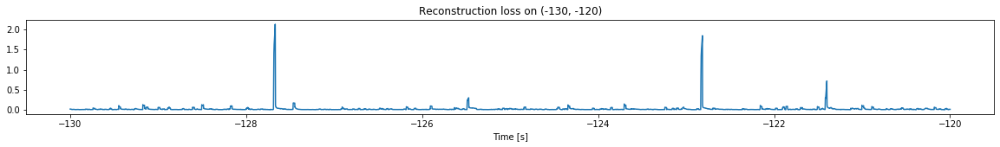

<--------
Entering sections:  (-120, -110)
-------->
Training for section:  (-130, -120)


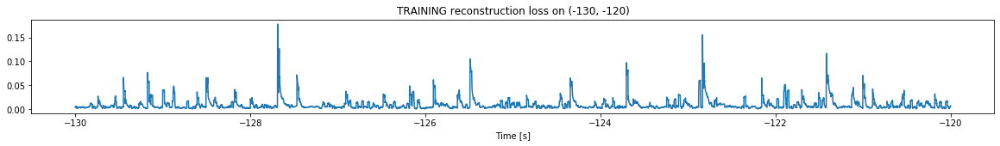

Finished training, median of the log(loss) is:  -2.2234904324871803
Triggering for section:  (-120, -110)
Using this median for triggering: -2.2607704719105954


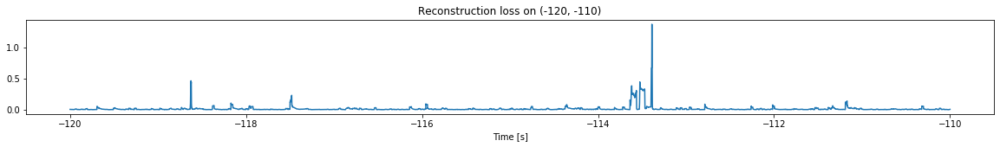

<--------
Entering sections:  (-110, -100)
-------->
Training for section:  (-120, -110)


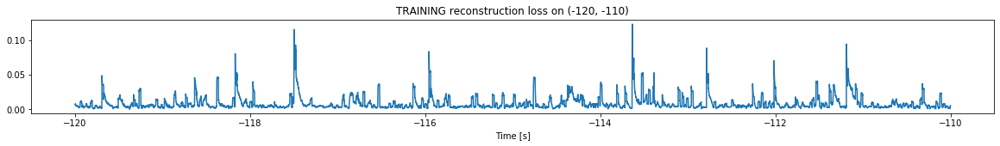

Finished training, median of the log(loss) is:  -2.2649990215791367
Triggering for section:  (-110, -100)
Using this median for triggering: -2.2234904324871803


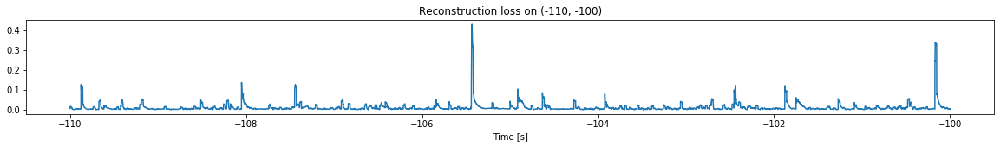

<--------
Entering sections:  (-100, -90)
-------->
Training for section:  (-110, -100)


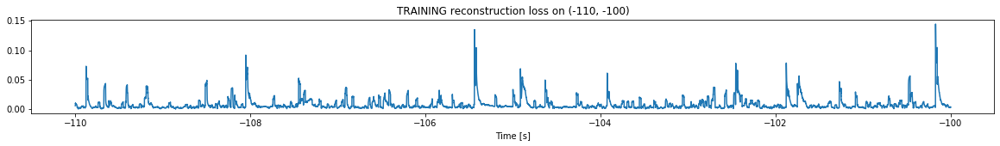

Finished training, median of the log(loss) is:  -2.2969882211221884
Triggering for section:  (-100, -90)
Using this median for triggering: -2.2649990215791367


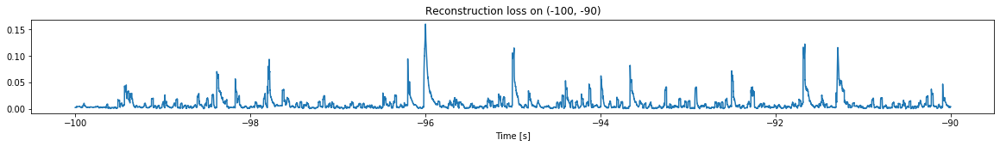

<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


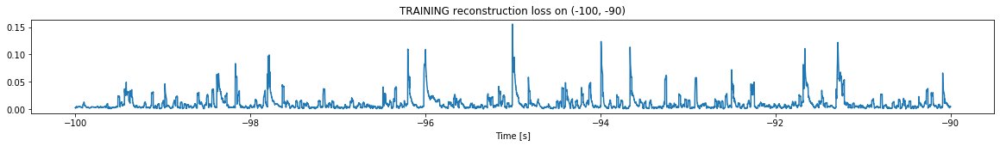

Finished training, median of the log(loss) is:  -2.1838829847238515
Triggering for section:  (-90, -80)
Using this median for triggering: -2.2969882211221884


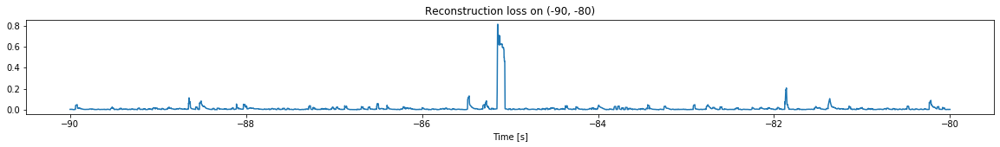

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


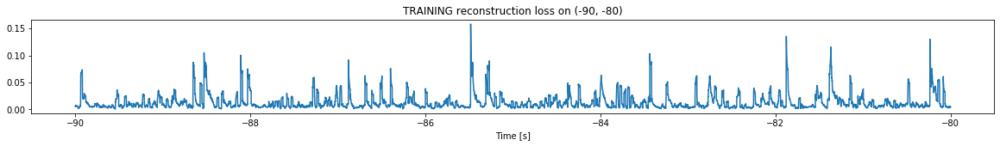

Finished training, median of the log(loss) is:  -2.072510683326169
Triggering for section:  (-80, -70)
Using this median for triggering: -2.1838829847238515


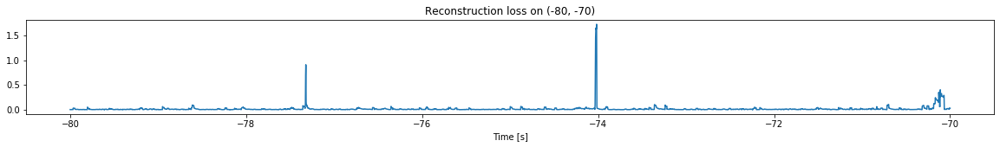

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


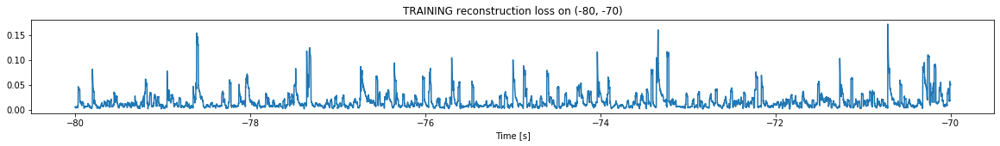

Finished training, median of the log(loss) is:  -1.9332796991155967
Triggering for section:  (-70, -60)
Using this median for triggering: -2.072510683326169


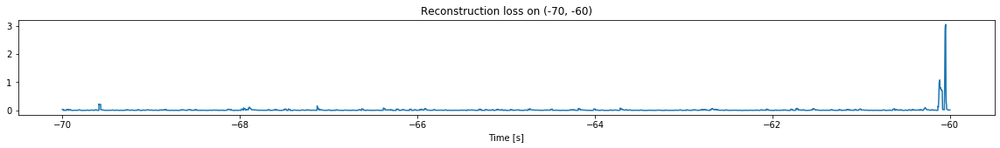

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


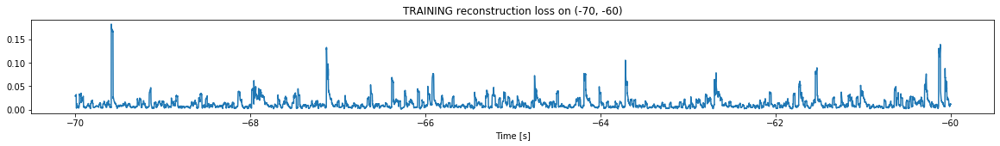

Finished training, median of the log(loss) is:  -2.0371485510361333
Triggering for section:  (-60, -50)
Using this median for triggering: -1.9332796991155967


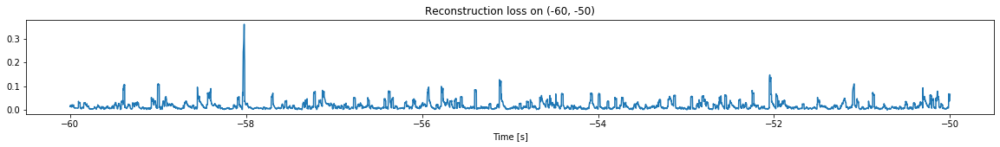

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


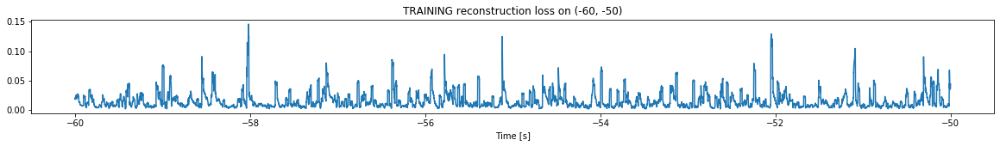

Finished training, median of the log(loss) is:  -1.9526493373814091
Triggering for section:  (-50, -40)
Using this median for triggering: -2.0371485510361333


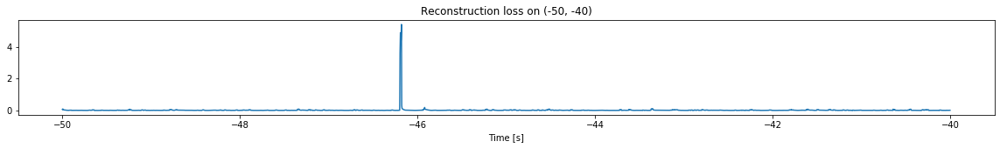

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


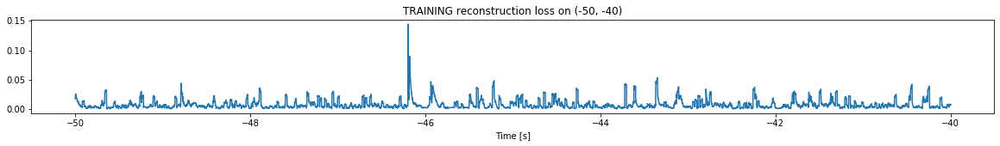

Finished training, median of the log(loss) is:  -2.245462543393543
Triggering for section:  (-40, -30)
Using this median for triggering: -1.9526493373814091


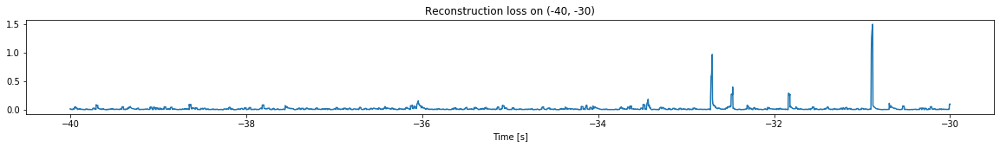

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


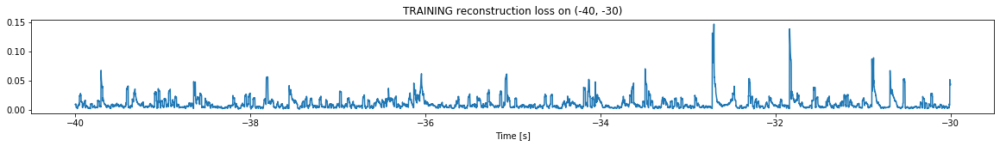

Finished training, median of the log(loss) is:  -2.165013610759363
Triggering for section:  (-30, -20)
Using this median for triggering: -2.245462543393543


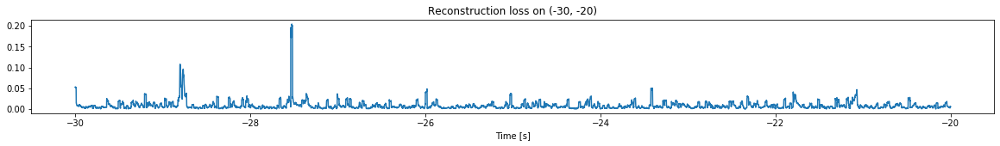

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


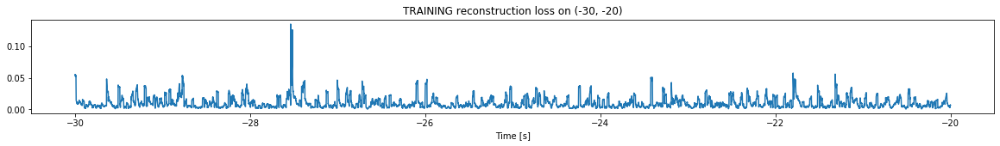

Finished training, median of the log(loss) is:  -2.111862055629683
Triggering for section:  (-20, -10)
Using this median for triggering: -2.165013610759363


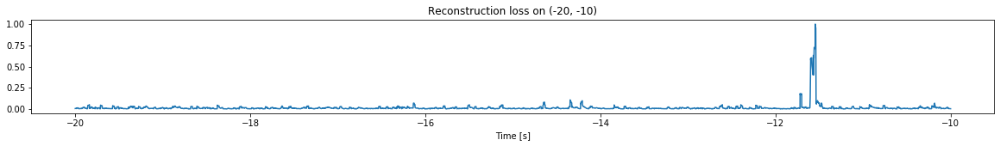

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


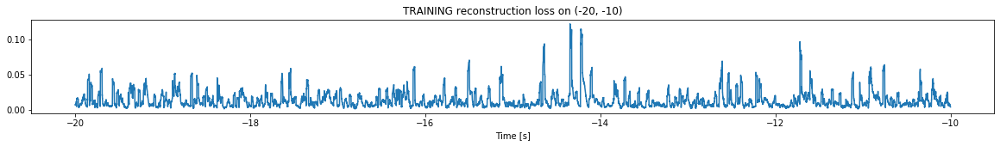

Finished training, median of the log(loss) is:  -1.9911761348905919
Triggering for section:  (-10, 0)
Using this median for triggering: -2.111862055629683


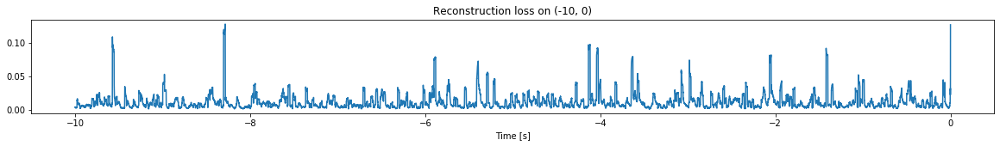

<--------
Finished simulation, all the triggered times are:  [-147.86848, -145.93748, -145.08798, -144.53598, -144.03558, -143.45969, -142.92929, -142.41728, -141.88719, -141.18478, -140.6361, -139.86319, -139.12608, -137.92468, -136.77028, -136.0718, -135.52599, -134.75859, -133.88739, -133.08589, -132.0474, -131.52489, -130.09099]


In [12]:
simulation("./data/Ramp20/", 10, (-195,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (1199800, 13)
Flushing input history
Number of sections: 12
Entering sections:  (-120, -110)
-------->
Entering sections:  (-110, -100)
-------->
Training for section:  (None, -110)


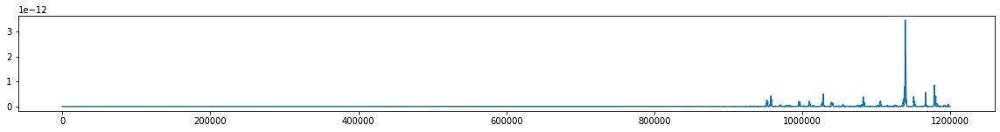

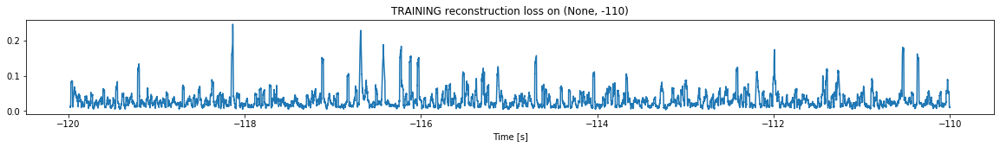

Finished training, median of the log(loss) is:  -1.6040799879834309
<--------
Entering sections:  (-100, -90)
-------->
Training for section:  (-110, -100)


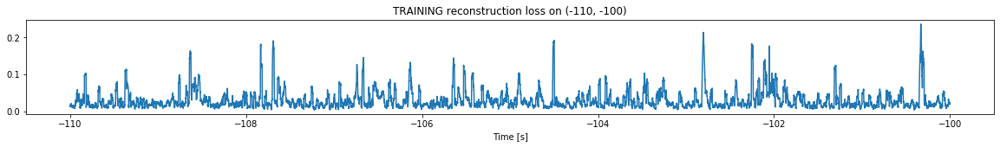

Finished training, median of the log(loss) is:  -1.6356831190656125
Triggering for section:  (-100, -90)
Using this median for triggering: -1.6040799879834309


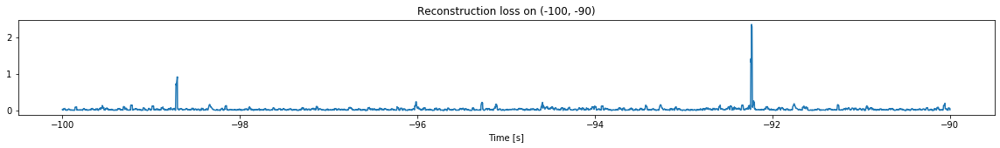

<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


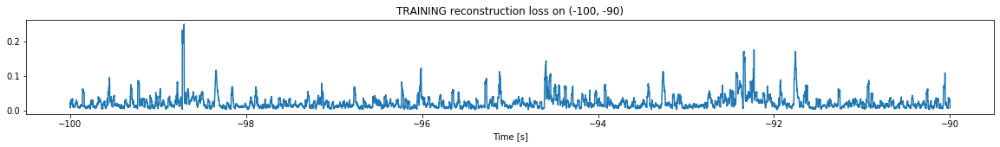

Finished training, median of the log(loss) is:  -1.7424967213303502
Triggering for section:  (-90, -80)
Using this median for triggering: -1.6356831190656125


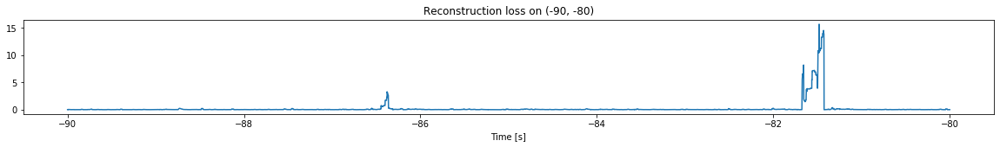

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


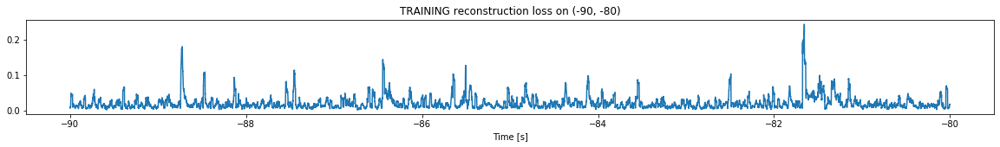

Finished training, median of the log(loss) is:  -1.7844157252029618
Triggering for section:  (-80, -70)
Using this median for triggering: -1.7424967213303502


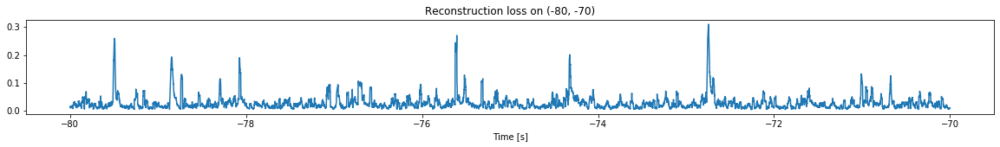

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


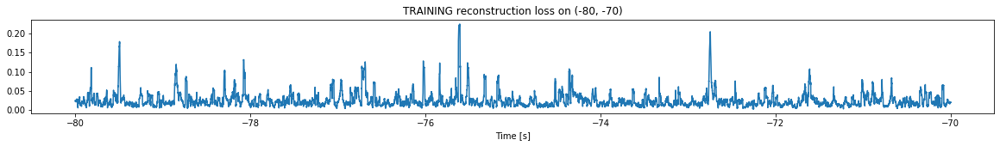

Finished training, median of the log(loss) is:  -1.6884216126064766
Triggering for section:  (-70, -60)
Using this median for triggering: -1.7844157252029618


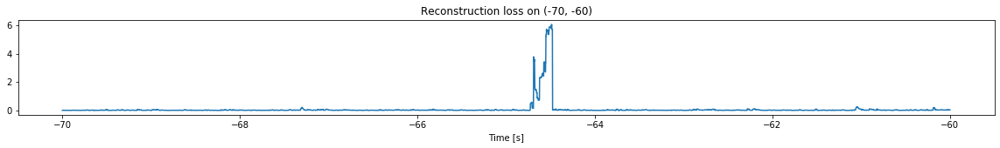

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


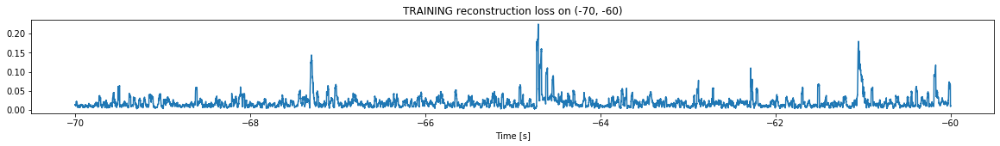

Finished training, median of the log(loss) is:  -1.8151923950105988
Triggering for section:  (-60, -50)
Using this median for triggering: -1.6884216126064766


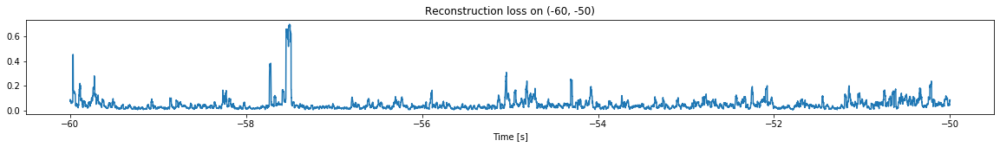

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


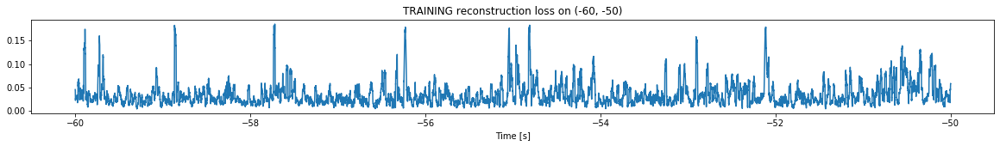

Finished training, median of the log(loss) is:  -1.5431413093749553
Triggering for section:  (-50, -40)
Using this median for triggering: -1.8151923950105988


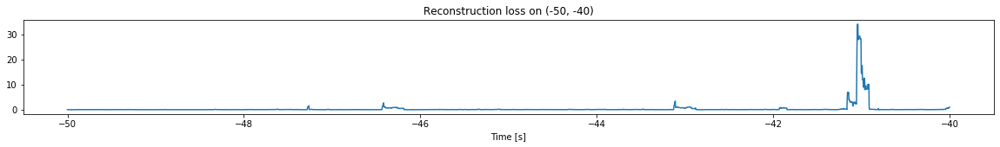

Other trigger time:  [-41.0445]
Their log loss values are:  [3.3465023]


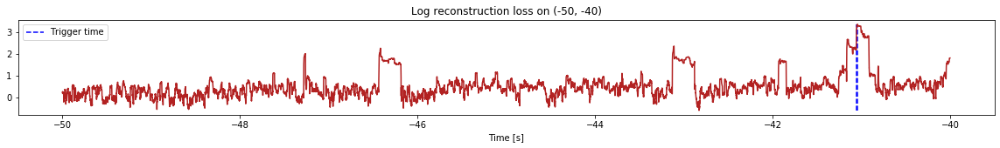

Triggered at:  [-41.0445]
<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


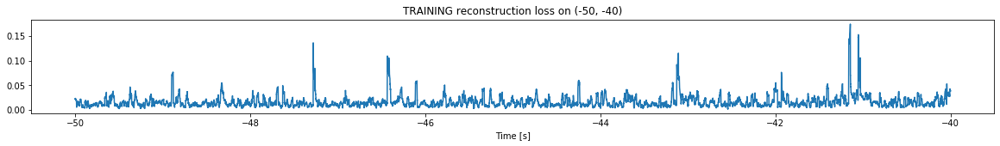

Finished training, median of the log(loss) is:  -1.8644238966945685
Triggering for section:  (-40, -30)
Using this median for triggering: -1.5431413093749553


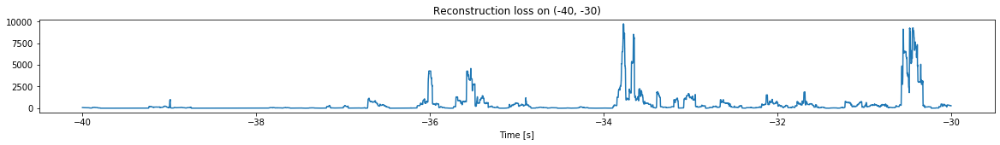

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


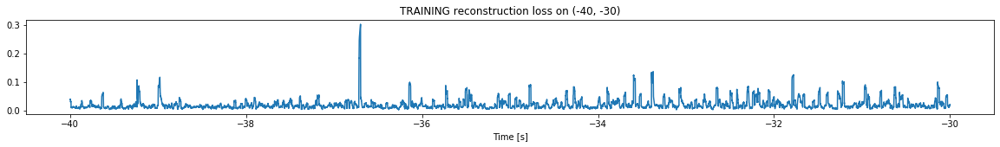

Finished training, median of the log(loss) is:  -1.7965365588400546
Triggering for section:  (-30, -20)
Using this median for triggering: -1.8644238966945685


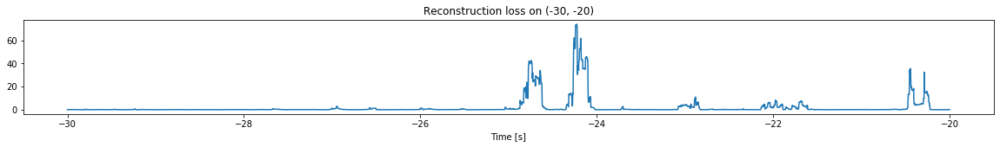

Other trigger time:  [-24.7431   -24.225199 -20.4439  ]
Their log loss values are:  [3.49386516 3.73349196 3.41574712]


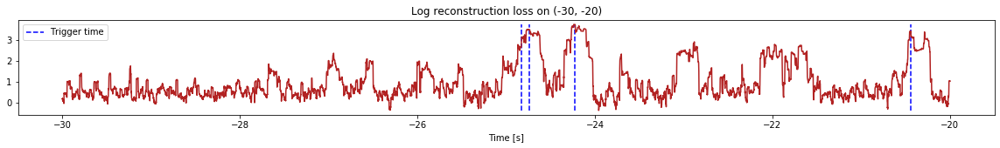

Triggered at:  [-24.7431, -24.225199, -20.4439]
<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


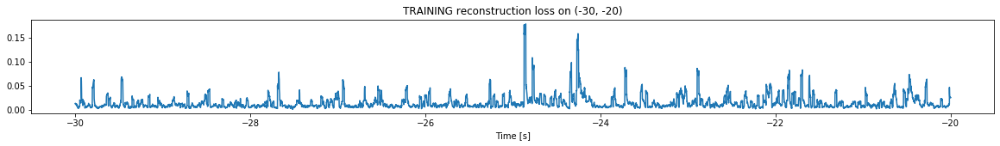

Finished training, median of the log(loss) is:  -1.968595861134495
Triggering for section:  (-20, -10)
Using this median for triggering: -1.7965365588400546


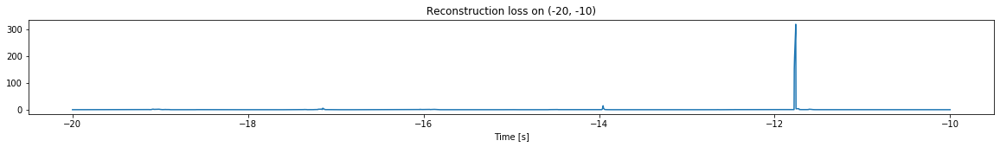

Other trigger time:  [-11.759]
Their log loss values are:  [4.29931806]


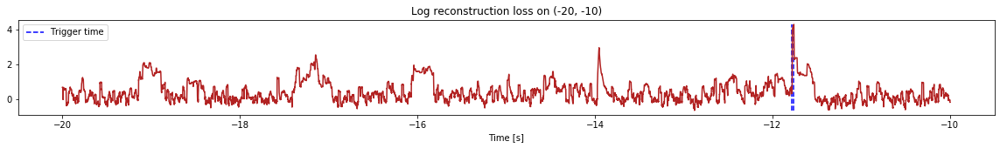

Triggered at:  [-11.759]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


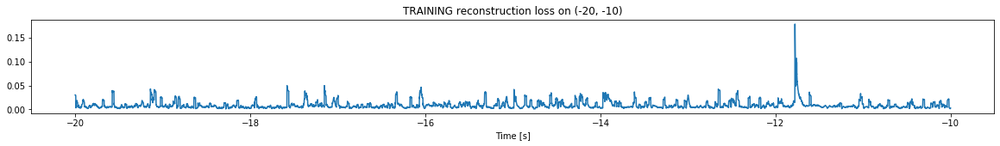

Finished training, median of the log(loss) is:  -2.174680143625008
Triggering for section:  (-10, 0)
Using this median for triggering: -1.968595861134495


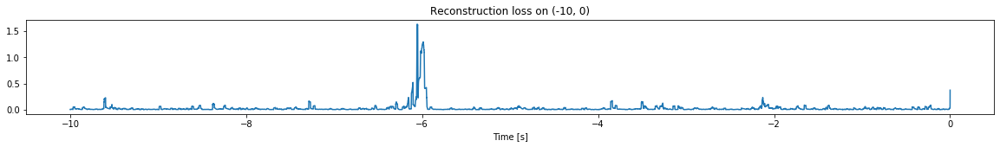

<--------
Finished simulation, all the triggered times are:  [-41.0445, -24.7431, -24.225199, -20.4439, -11.759]


In [13]:
simulation("./data/Ramp21/", 10, (-120,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (799800, 13)
Flushing input history
Number of sections: 8
Entering sections:  (-80, -70)
-------->
Entering sections:  (-70, -60)
-------->
Training for section:  (None, -70)


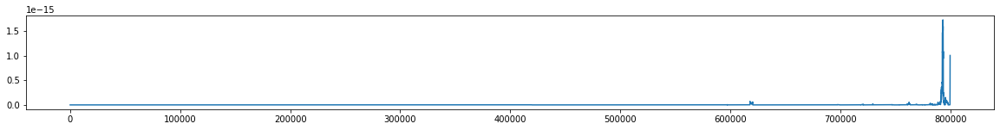

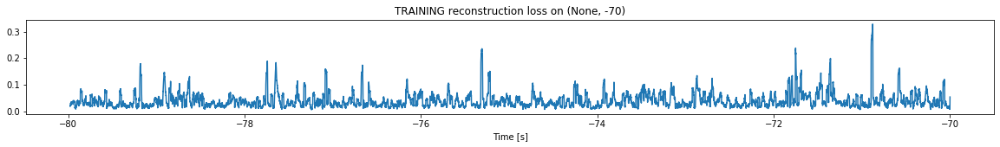

Finished training, median of the log(loss) is:  -1.4791978169847408
<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


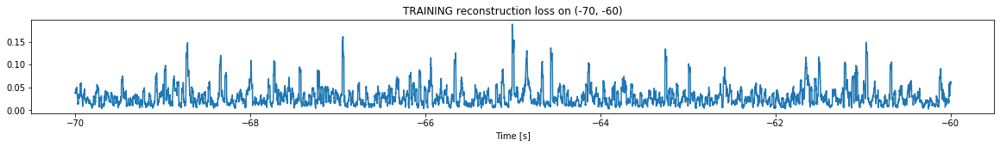

Finished training, median of the log(loss) is:  -1.6039768489370538
Triggering for section:  (-60, -50)
Using this median for triggering: -1.4791978169847408


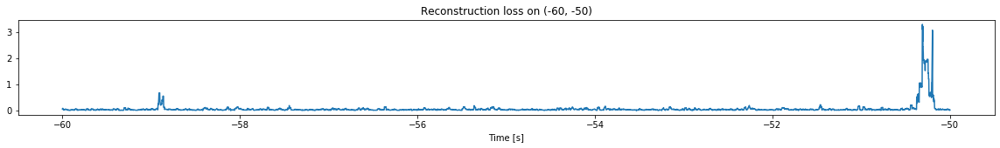

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


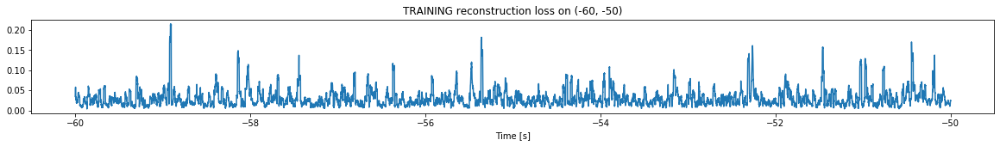

Finished training, median of the log(loss) is:  -1.5948701792748583
Triggering for section:  (-50, -40)
Using this median for triggering: -1.6039768489370538


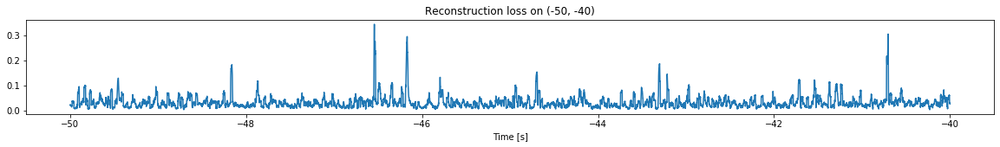

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


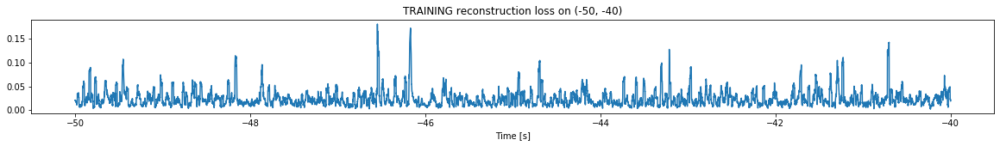

Finished training, median of the log(loss) is:  -1.6937666564413068
Triggering for section:  (-40, -30)
Using this median for triggering: -1.5948701792748583


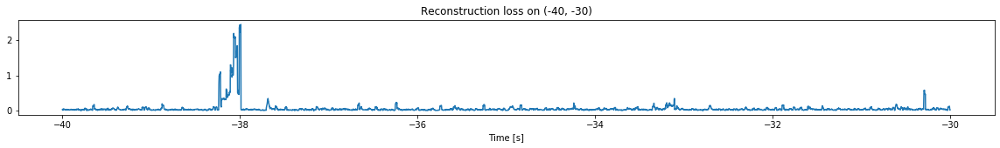

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


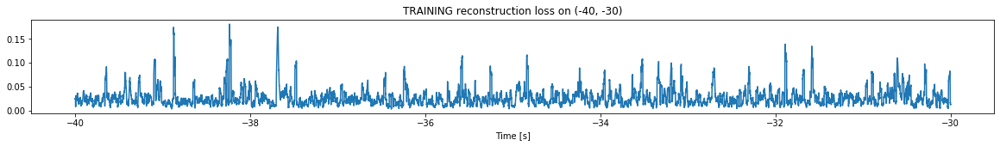

Finished training, median of the log(loss) is:  -1.6356979721479008
Triggering for section:  (-30, -20)
Using this median for triggering: -1.6937666564413068


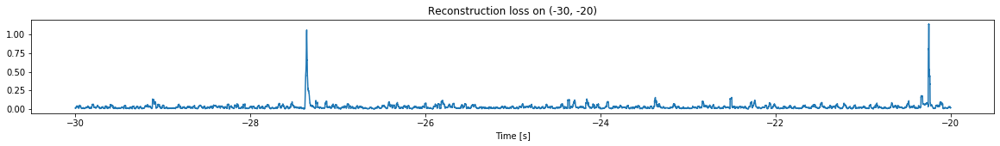

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


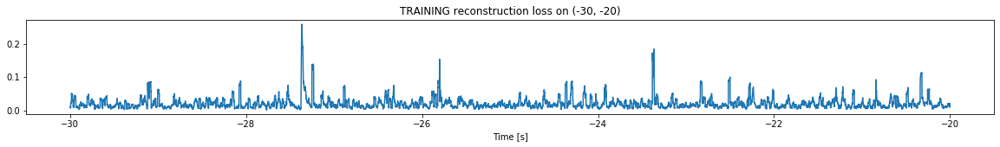

Finished training, median of the log(loss) is:  -1.7718305861203842
Triggering for section:  (-20, -10)
Using this median for triggering: -1.6356979721479008


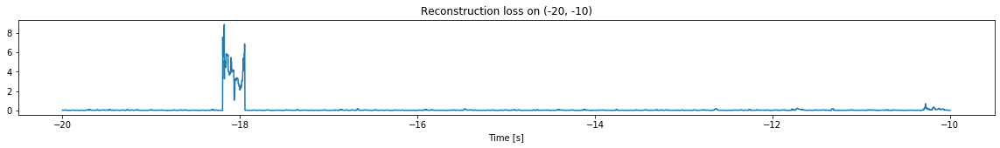

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


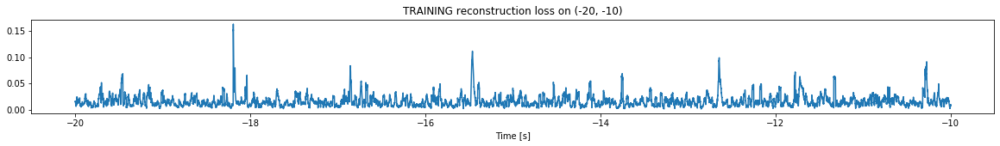

Finished training, median of the log(loss) is:  -1.8604096211350327
Triggering for section:  (-10, 0)
Using this median for triggering: -1.7718305861203842


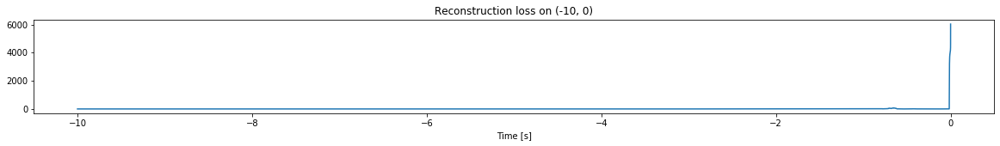

Other trigger time:  [-0.6509]
Their log loss values are:  [3.61288006]


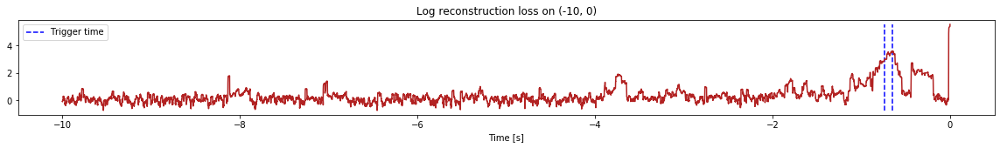

Triggered at:  [-0.6509]
<--------
Finished simulation, all the triggered times are:  [-0.6509]


In [9]:
simulation("./data/Ramp22/", 10, (-80,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (499800, 13)
Flushing input history
Number of sections: 5
Entering sections:  (-50, -40)
-------->
Entering sections:  (-40, -30)
-------->
Training for section:  (None, -40)


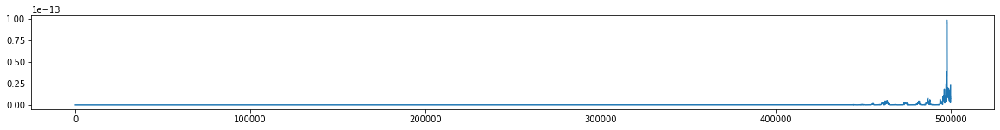

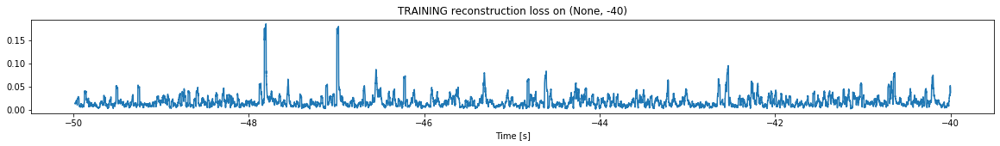

Finished training, median of the log(loss) is:  -1.8180349510278453
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


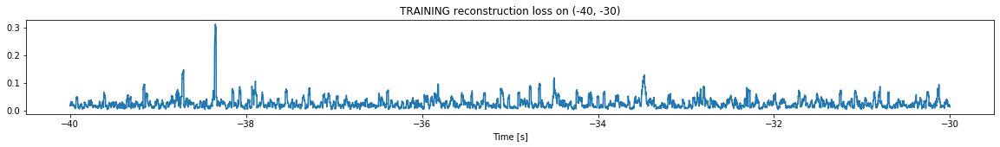

Finished training, median of the log(loss) is:  -1.6509410937579103
Triggering for section:  (-30, -20)
Using this median for triggering: -1.8180349510278453


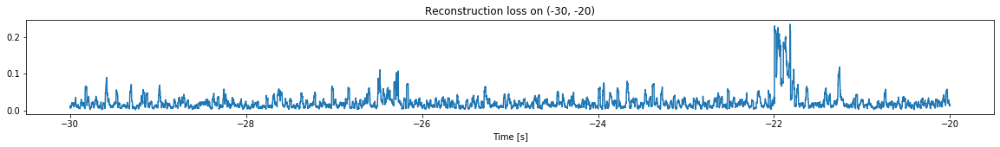

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


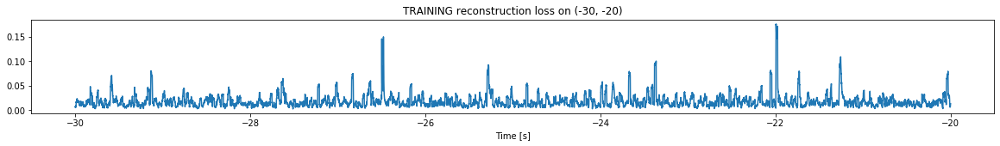

Finished training, median of the log(loss) is:  -1.8097314291580118
Triggering for section:  (-20, -10)
Using this median for triggering: -1.6509410937579103


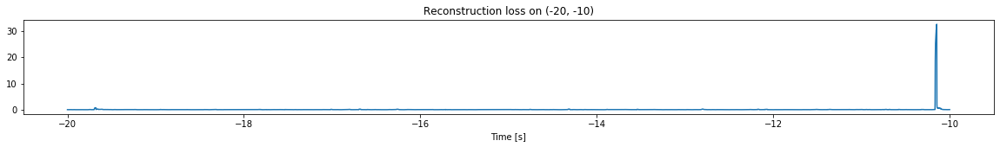

Other trigger time:  [-10.1461]
Their log loss values are:  [3.1643336]


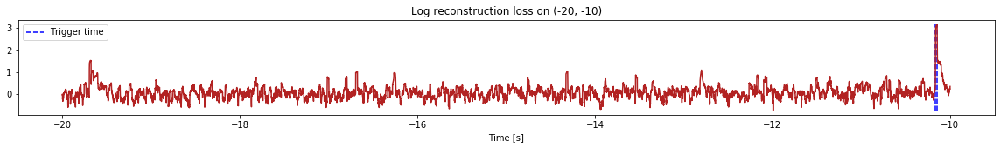

Triggered at:  [-10.1461]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


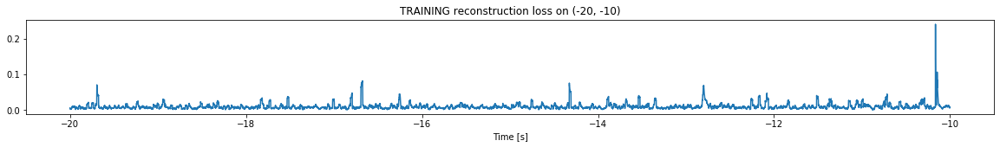

Finished training, median of the log(loss) is:  -2.0781543969641785
Triggering for section:  (-10, 0)
Using this median for triggering: -1.8097314291580118


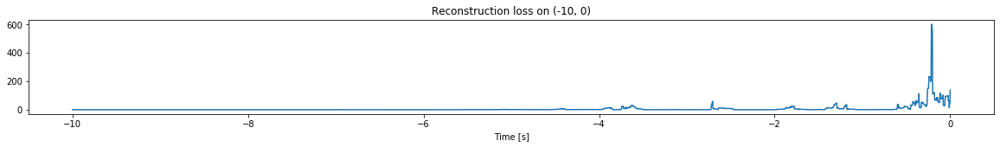

Other trigger time:  [-3.6151     -2.7054     -1.8057     -1.2943     -0.21249999]
Their log loss values are:  [3.29821415 3.57824272 3.23490792 3.48658524 4.58949136]


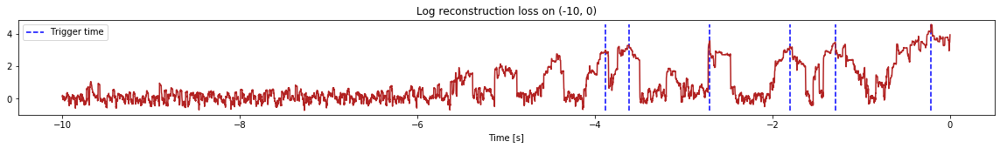

Triggered at:  [-3.6151, -2.7054, -1.8057, -1.2943, -0.21249999]
<--------
Finished simulation, all the triggered times are:  [-10.1461, -3.6151, -2.7054, -1.8057, -1.2943, -0.21249999]


In [14]:
simulation("./data/Ramp23/", 10, (-50,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (1099800, 13)
Flushing input history
Number of sections: 11
Entering sections:  (-110, -100)
-------->
Entering sections:  (-100, -90)
-------->
Training for section:  (None, -100)


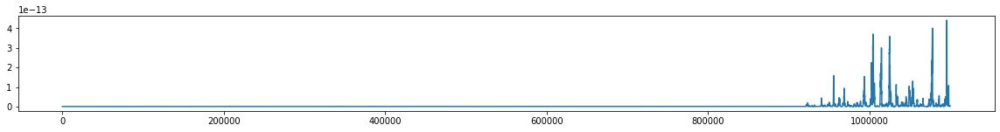

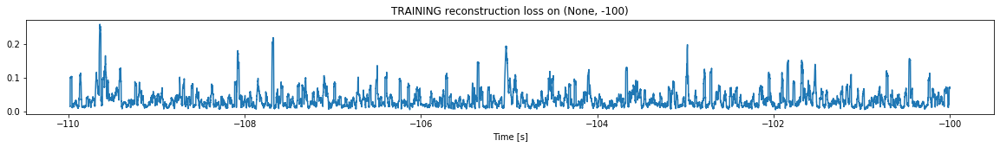

Finished training, median of the log(loss) is:  -1.5572747397525097
<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


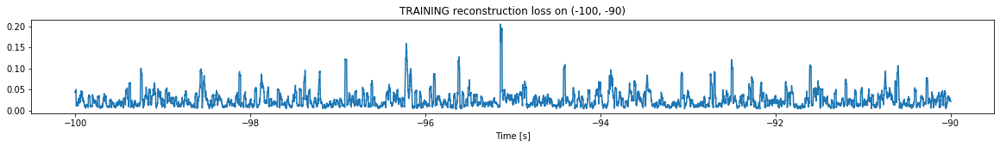

Finished training, median of the log(loss) is:  -1.6882027394230092
Triggering for section:  (-90, -80)
Using this median for triggering: -1.5572747397525097


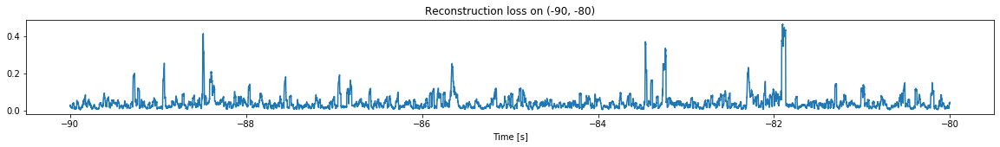

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


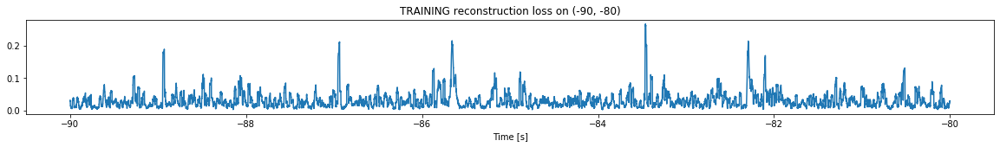

Finished training, median of the log(loss) is:  -1.5759013576068113
Triggering for section:  (-80, -70)
Using this median for triggering: -1.6882027394230092


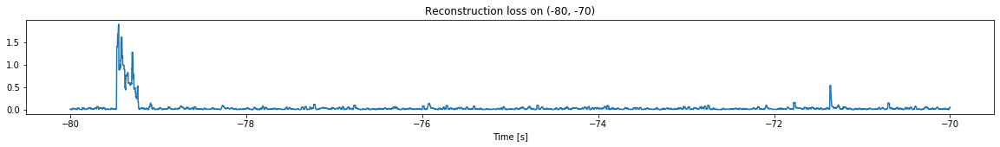

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


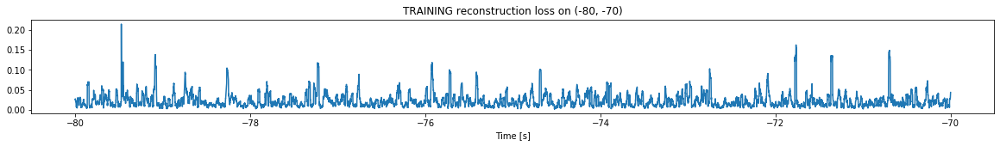

Finished training, median of the log(loss) is:  -1.733905932248096
Triggering for section:  (-70, -60)
Using this median for triggering: -1.5759013576068113


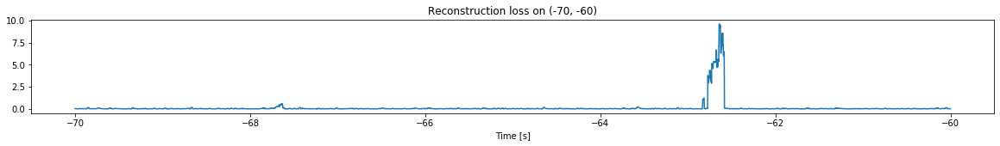

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


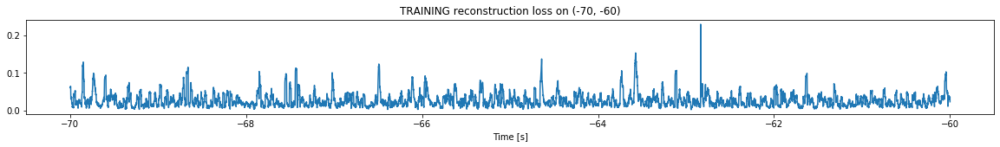

Finished training, median of the log(loss) is:  -1.6360357857135963
Triggering for section:  (-60, -50)
Using this median for triggering: -1.733905932248096


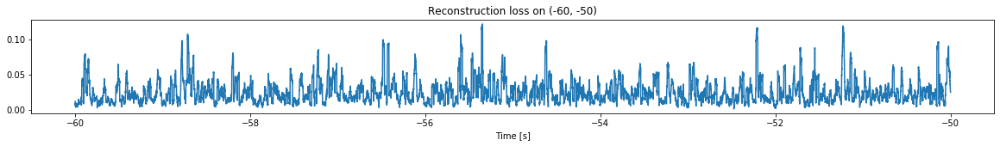

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


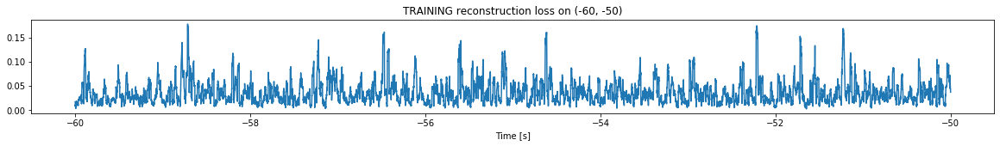

Finished training, median of the log(loss) is:  -1.4956256624630906
Triggering for section:  (-50, -40)
Using this median for triggering: -1.6360357857135963


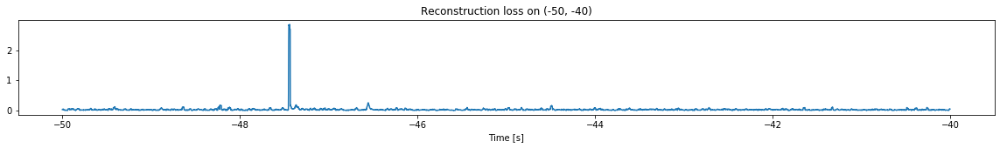

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


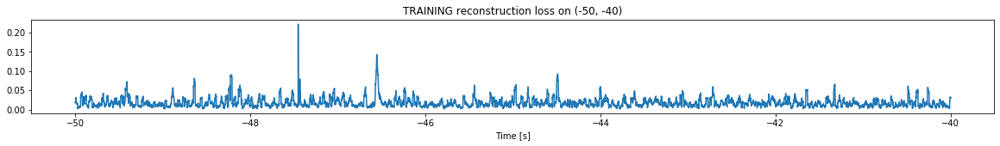

Finished training, median of the log(loss) is:  -1.8159965448065147
Triggering for section:  (-40, -30)
Using this median for triggering: -1.4956256624630906


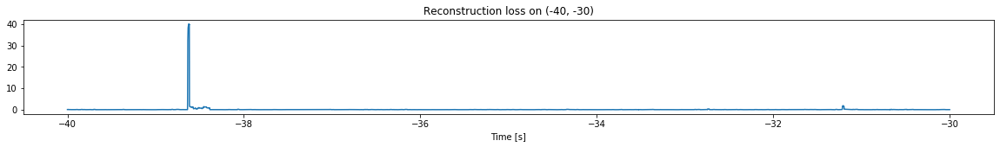

Other trigger time:  [-38.6228]
Their log loss values are:  [3.09816442]


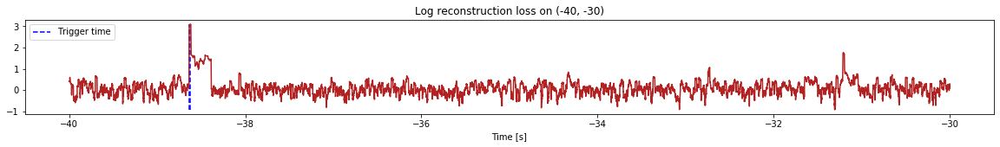

Triggered at:  [-38.6228]
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


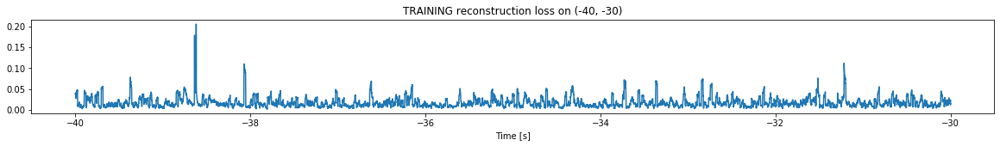

Finished training, median of the log(loss) is:  -1.8539622939275715
Triggering for section:  (-30, -20)
Using this median for triggering: -1.8159965448065147


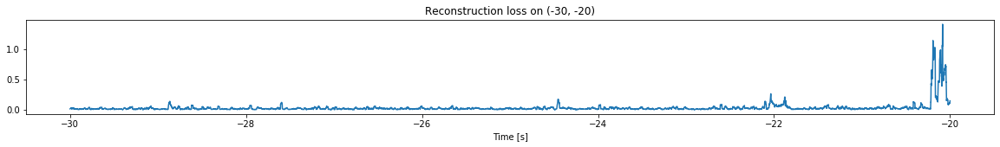

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


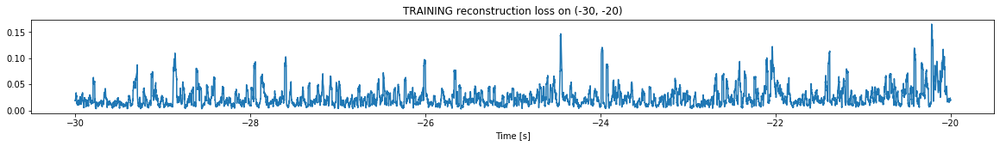

Finished training, median of the log(loss) is:  -1.6918037681149833
Triggering for section:  (-20, -10)
Using this median for triggering: -1.8539622939275715


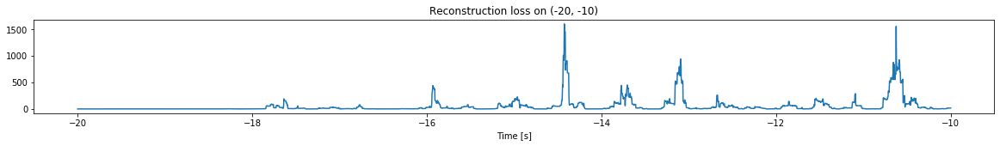

Other trigger time:  [-17.6369   -16.7733   -15.929999 -14.962    -14.424999 -13.7056
 -13.0918   -12.5917   -11.5411   -10.6247   -10.0286  ]
Their log loss values are:  [4.13765234 3.74766501 4.4986247  4.20248238 5.05929765 4.50593725
 4.82922508 3.83686581 4.15875838 5.04729807 3.09037861]


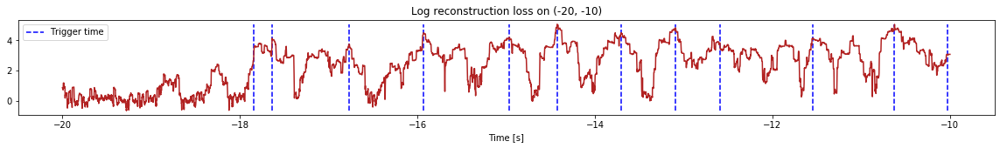

Triggered at:  [-17.6369, -16.7733, -15.929999, -14.962, -14.424999, -13.7056, -13.0918, -12.5917, -11.5411, -10.6247, -10.0286]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


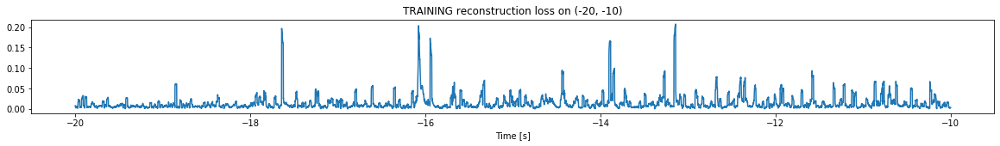

Finished training, median of the log(loss) is:  -2.0023701794848128
Triggering for section:  (-10, 0)
Using this median for triggering: -1.6918037681149833


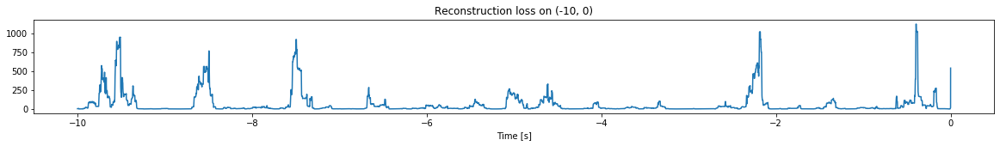

Other trigger time:  [-9.5096     -8.4948     -7.4932     -6.6626     -6.0049     -5.4437
 -4.6131997  -4.0442     -3.3274999  -2.1826     -1.3424     -0.39499998]
Their log loss values are:  [4.66845651 4.57634524 4.65455111 4.14522813 3.41203693 3.79921935
 4.20988426 3.64345231 3.69843313 4.70017558 3.83937949 4.74140039]


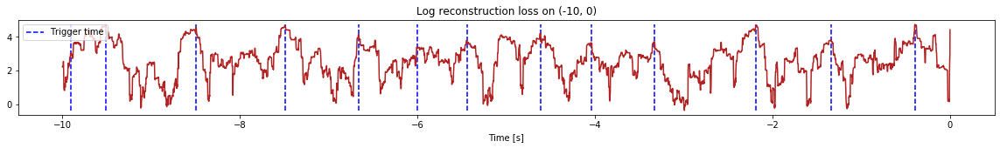

Triggered at:  [-9.5096, -8.4948, -7.4932, -6.6626, -6.0049, -5.4437, -4.6131997, -4.0442, -3.3274999, -2.1826, -1.3424, -0.39499998]
<--------
Finished simulation, all the triggered times are:  [-38.6228, -17.6369, -16.7733, -15.929999, -14.962, -14.424999, -13.7056, -13.0918, -12.5917, -11.5411, -10.6247, -10.0286, -9.5096, -8.4948, -7.4932, -6.6626, -6.0049, -5.4437, -4.6131997, -4.0442, -3.3274999, -2.1826, -1.3424, -0.39499998]


In [15]:
simulation("./data/Ramp24/", 10, (-110,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (999800, 13)
Flushing input history
Number of sections: 10
Entering sections:  (-100, -90)
-------->
Entering sections:  (-90, -80)
-------->
Training for section:  (None, -90)


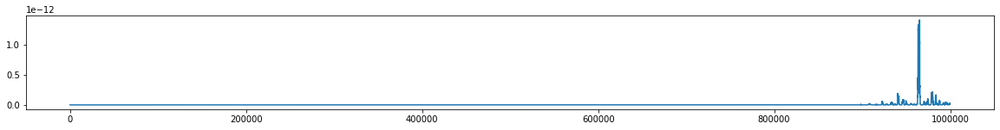

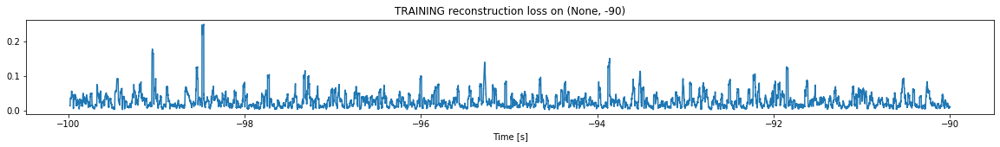

Finished training, median of the log(loss) is:  -1.63237482810633
<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


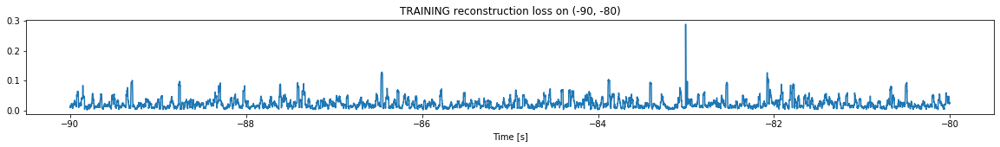

Finished training, median of the log(loss) is:  -1.7112709056612014
Triggering for section:  (-80, -70)
Using this median for triggering: -1.63237482810633


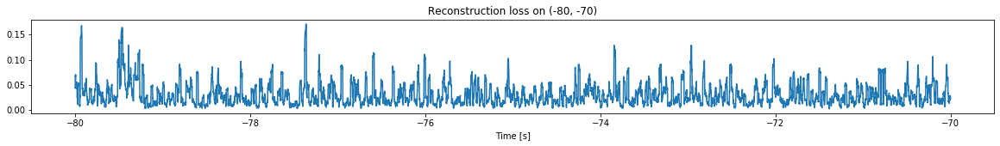

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


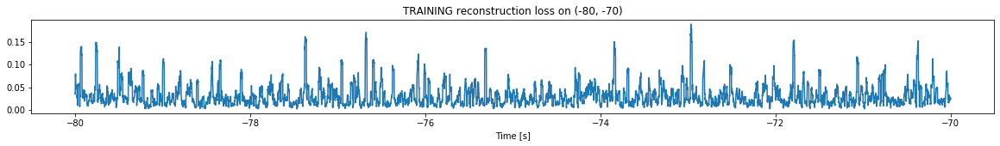

Finished training, median of the log(loss) is:  -1.5900225192412654
Triggering for section:  (-70, -60)
Using this median for triggering: -1.7112709056612014


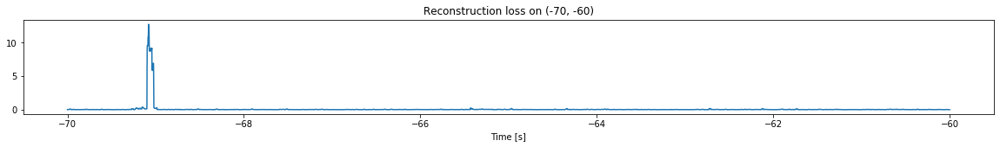

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


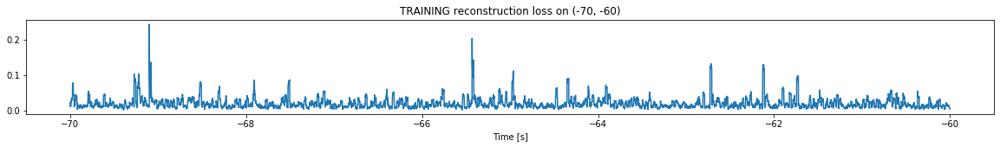

Finished training, median of the log(loss) is:  -1.7904228673895406
Triggering for section:  (-60, -50)
Using this median for triggering: -1.5900225192412654


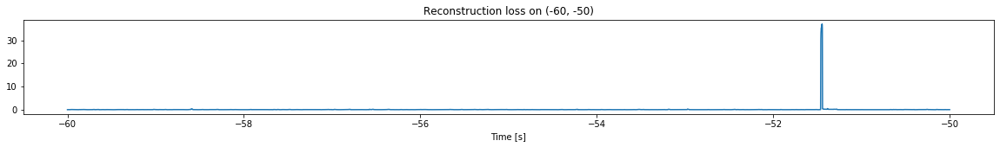

Other trigger time:  [-51.4463]
Their log loss values are:  [3.15713161]


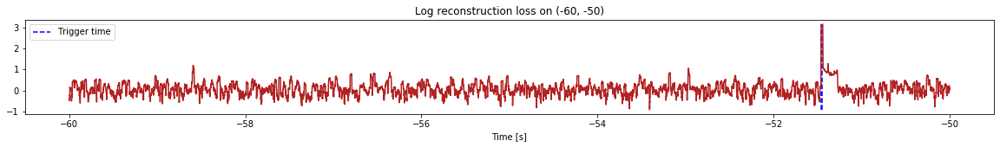

Triggered at:  [-51.4463]
<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


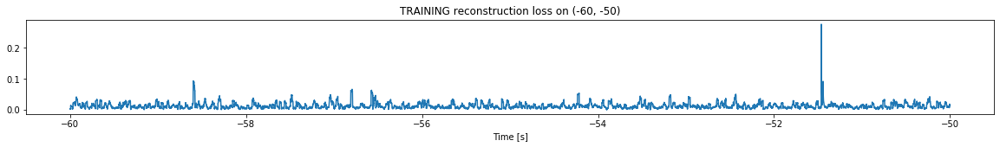

Finished training, median of the log(loss) is:  -1.9458156322158053
Triggering for section:  (-50, -40)
Using this median for triggering: -1.7904228673895406


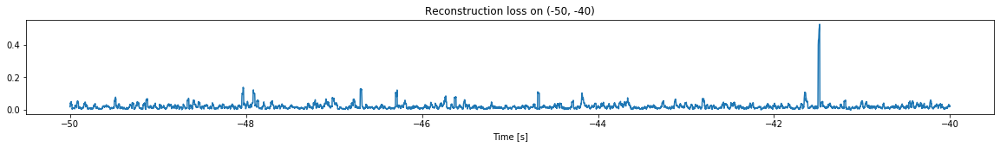

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


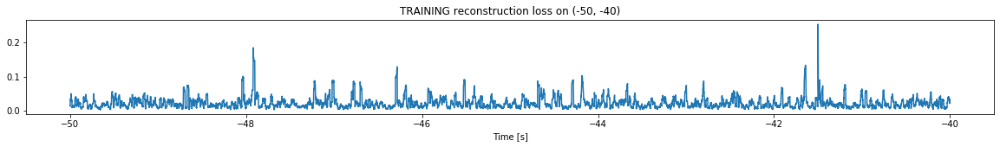

Finished training, median of the log(loss) is:  -1.7396645722205624
Triggering for section:  (-40, -30)
Using this median for triggering: -1.9458156322158053


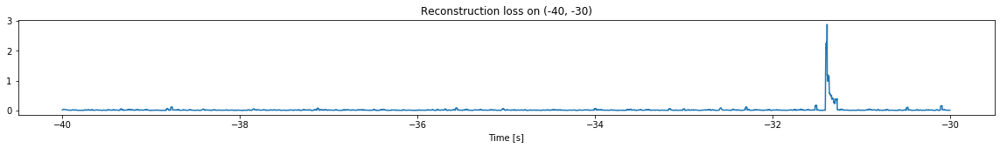

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


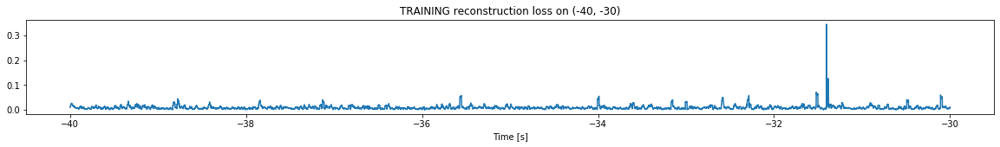

Finished training, median of the log(loss) is:  -2.0851838252295267
Triggering for section:  (-30, -20)
Using this median for triggering: -1.7396645722205624


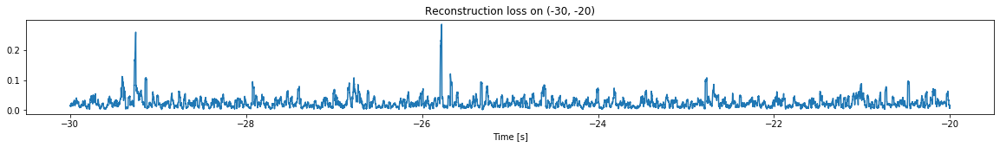

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


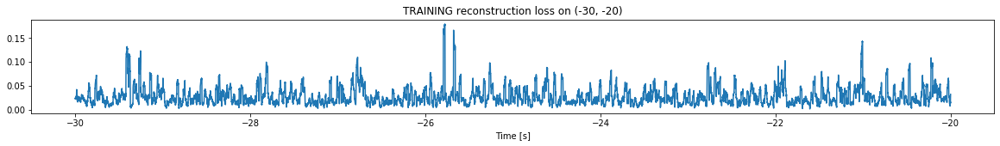

Finished training, median of the log(loss) is:  -1.6204915661985537
Triggering for section:  (-20, -10)
Using this median for triggering: -2.0851838252295267


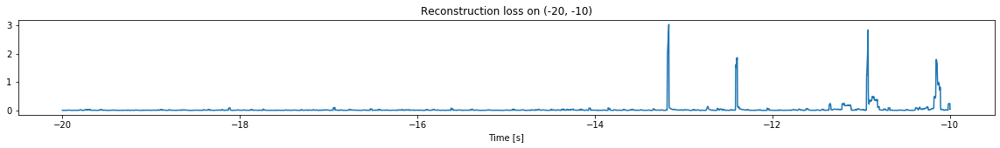

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


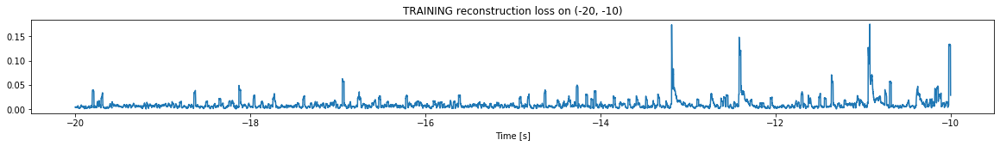

Finished training, median of the log(loss) is:  -2.1236529926145127
Triggering for section:  (-10, 0)
Using this median for triggering: -1.6204915661985537


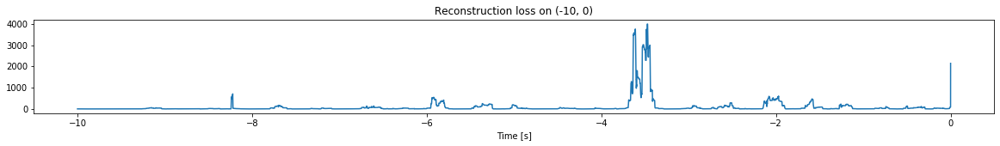

Other trigger time:  [-9.151899  -8.2217    -7.6955    -7.1875    -6.6043997 -5.9238
 -5.3617997 -4.4743    -3.4703999 -2.5193    -1.9707999 -1.2576
 -0.5003   ]
Their log loss values are:  [3.42088376 4.47113113 3.85522565 3.28214555 3.76293526 4.35566885
 4.02252719 3.44831881 5.22179483 4.08389859 4.40356712 3.98232912
 3.76571093]


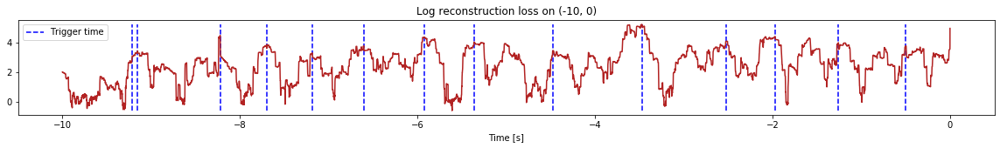

Triggered at:  [-9.151899, -8.2217, -7.6955, -7.1875, -6.6043997, -5.9238, -5.3617997, -4.4743, -3.4703999, -2.5193, -1.9707999, -1.2576, -0.5003]
<--------
Finished simulation, all the triggered times are:  [-51.4463, -9.151899, -8.2217, -7.6955, -7.1875, -6.6043997, -5.9238, -5.3617997, -4.4743, -3.4703999, -2.5193, -1.9707999, -1.2576, -0.5003]


In [16]:
simulation("./data/Ramp25/", 10, (-100,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (1099800, 13)
Flushing input history
Number of sections: 11
Entering sections:  (-110, -100)
-------->
Entering sections:  (-100, -90)
-------->
Training for section:  (None, -100)


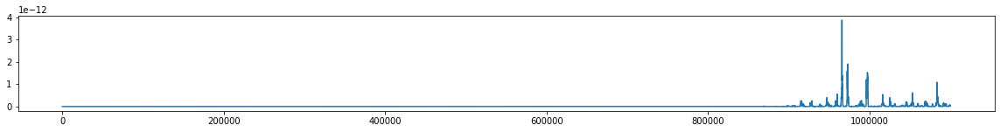

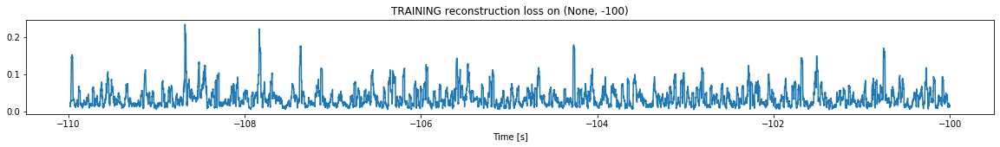

Finished training, median of the log(loss) is:  -1.4989094334739976
<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


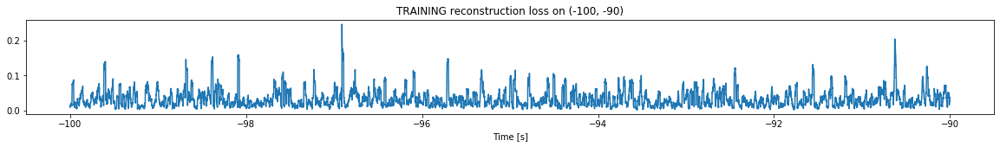

Finished training, median of the log(loss) is:  -1.5442594466758446
Triggering for section:  (-90, -80)
Using this median for triggering: -1.4989094334739976


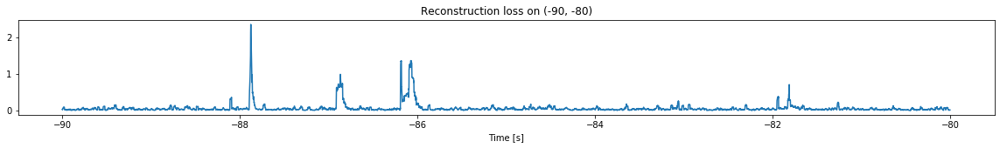

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


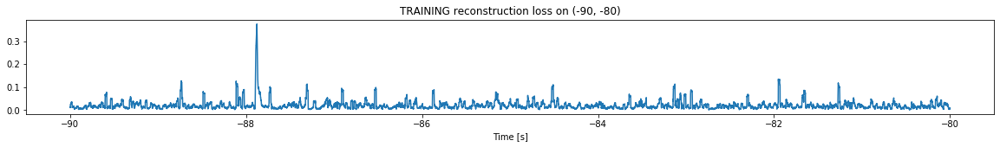

Finished training, median of the log(loss) is:  -1.7750528491363808
Triggering for section:  (-80, -70)
Using this median for triggering: -1.5442594466758446


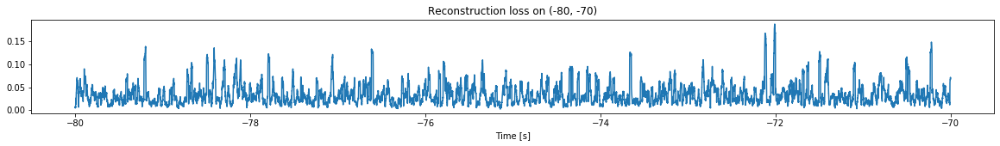

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


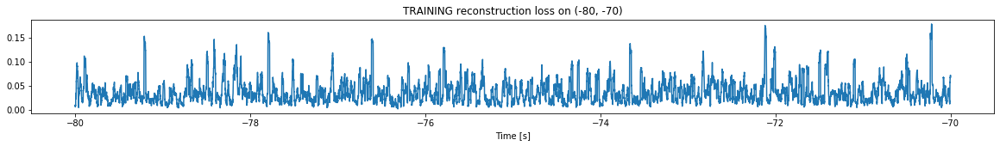

Finished training, median of the log(loss) is:  -1.4953323255404722
Triggering for section:  (-70, -60)
Using this median for triggering: -1.7750528491363808


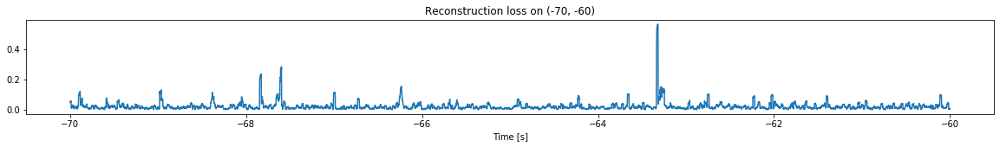

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


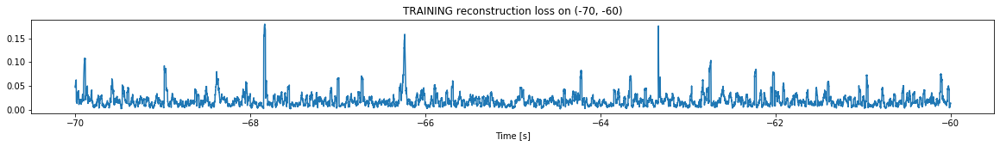

Finished training, median of the log(loss) is:  -1.7968124381146346
Triggering for section:  (-60, -50)
Using this median for triggering: -1.4953323255404722


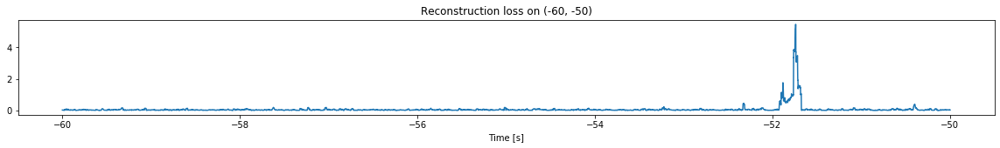

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


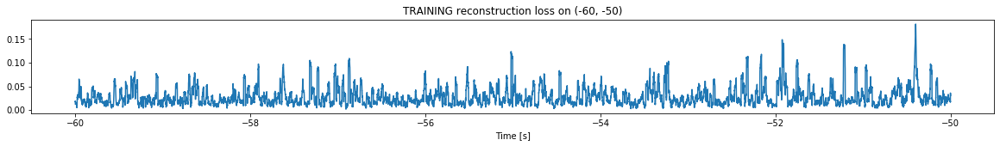

Finished training, median of the log(loss) is:  -1.6396000662496237
Triggering for section:  (-50, -40)
Using this median for triggering: -1.7968124381146346


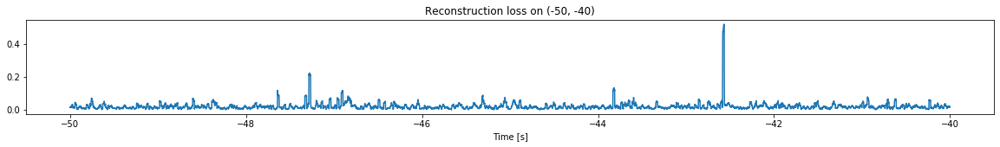

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


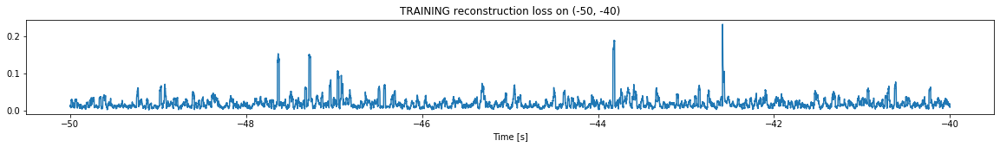

Finished training, median of the log(loss) is:  -1.796335652403811
Triggering for section:  (-40, -30)
Using this median for triggering: -1.6396000662496237


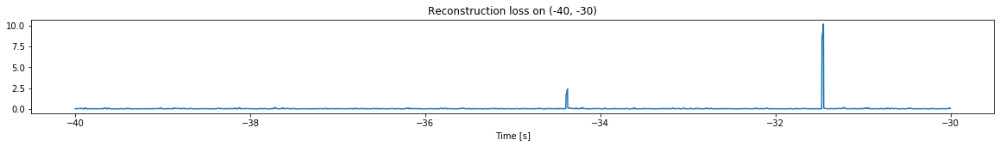

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


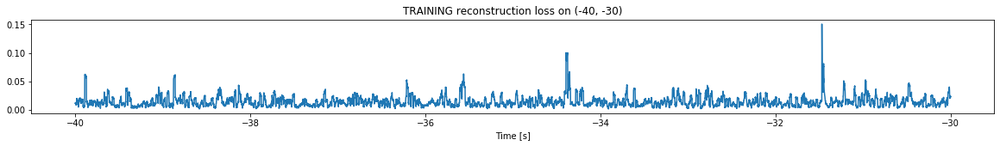

Finished training, median of the log(loss) is:  -1.9093413532816612
Triggering for section:  (-30, -20)
Using this median for triggering: -1.796335652403811


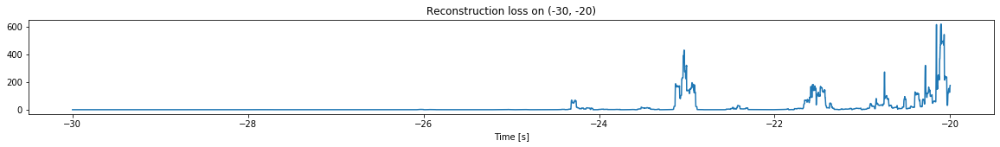

Other trigger time:  [-24.314299 -23.029999 -22.4216   -21.5602   -20.7481   -20.0999  ]
Their log loss values are:  [3.63607979 4.43015109 3.27475993 4.05513784 4.23082336 4.58660168]


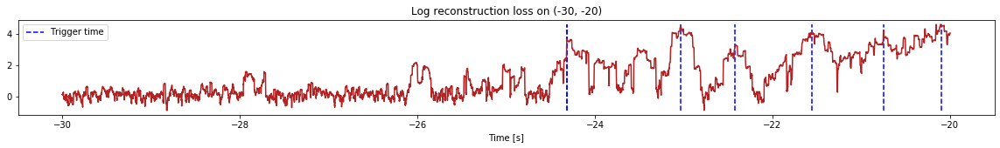

Triggered at:  [-24.314299, -23.029999, -22.4216, -21.5602, -20.7481, -20.0999]
<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


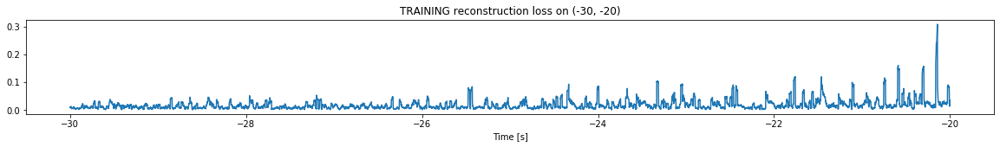

Finished training, median of the log(loss) is:  -1.863546429515011
Triggering for section:  (-20, -10)
Using this median for triggering: -1.9093413532816612


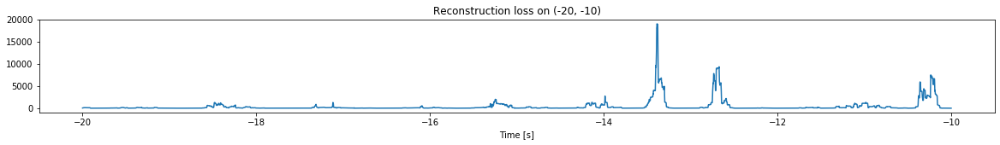

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


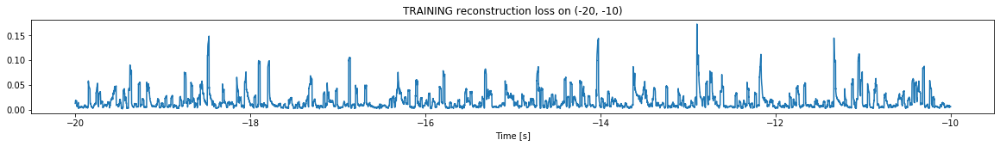

Finished training, median of the log(loss) is:  -1.9747568340263615
Triggering for section:  (-10, 0)
Using this median for triggering: -1.863546429515011


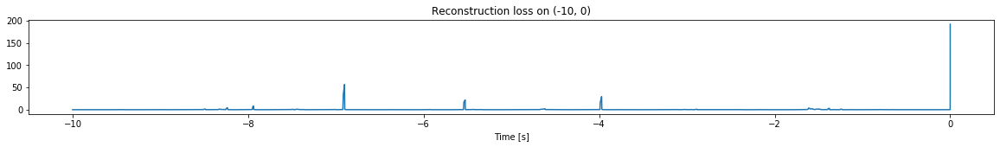

Other trigger time:  [-6.9013 -5.5269 -3.9722]
Their log loss values are:  [3.61704259 3.20573347 3.33312469]


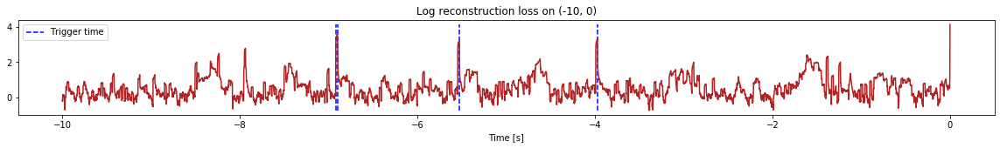

Triggered at:  [-6.9013, -5.5269, -3.9722]
<--------
Finished simulation, all the triggered times are:  [-24.314299, -23.029999, -22.4216, -21.5602, -20.7481, -20.0999, -6.9013, -5.5269, -3.9722]


In [17]:
simulation("./data/Ramp26/", 10, (-110,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (699800, 13)
Flushing input history
Number of sections: 7
Entering sections:  (-70, -60)
-------->
Entering sections:  (-60, -50)
-------->
Training for section:  (None, -60)


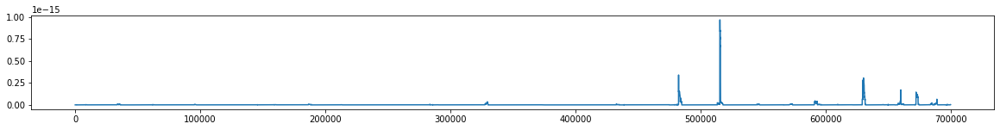

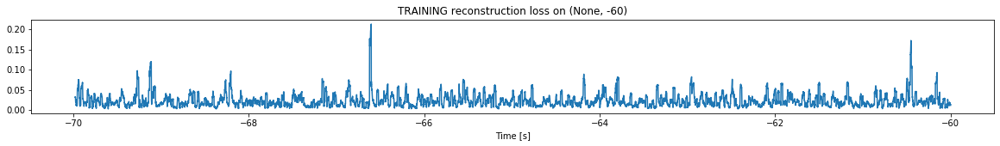

Finished training, median of the log(loss) is:  -1.7037165875907605
<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


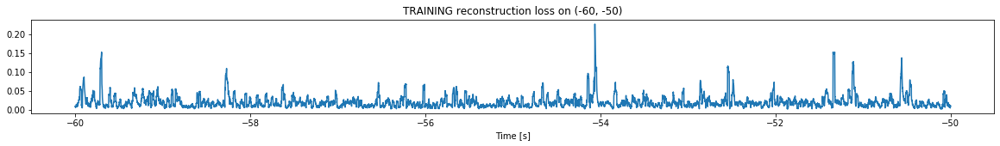

Finished training, median of the log(loss) is:  -1.7638429147788572
Triggering for section:  (-50, -40)
Using this median for triggering: -1.7037165875907605


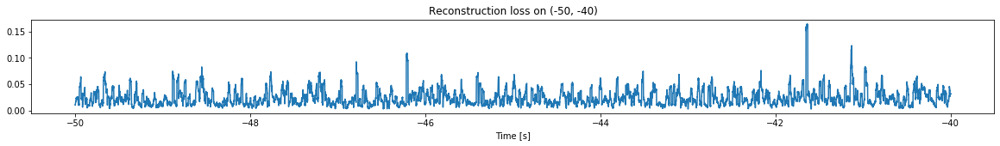

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


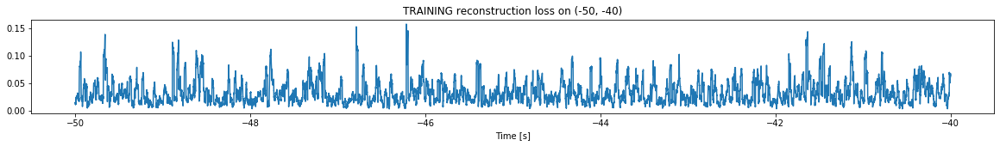

Finished training, median of the log(loss) is:  -1.5576684161710035
Triggering for section:  (-40, -30)
Using this median for triggering: -1.7638429147788572


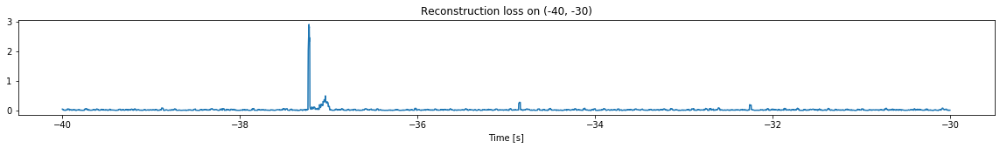

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


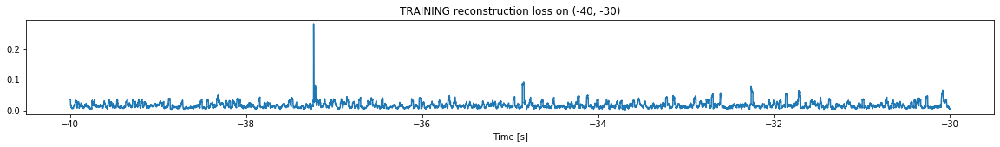

Finished training, median of the log(loss) is:  -1.8569302805854822
Triggering for section:  (-30, -20)
Using this median for triggering: -1.5576684161710035


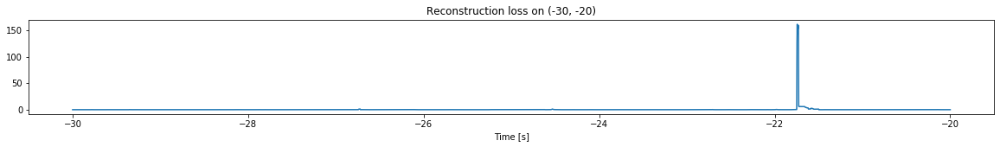

Other trigger time:  [-21.7433]
Their log loss values are:  [3.76499588]


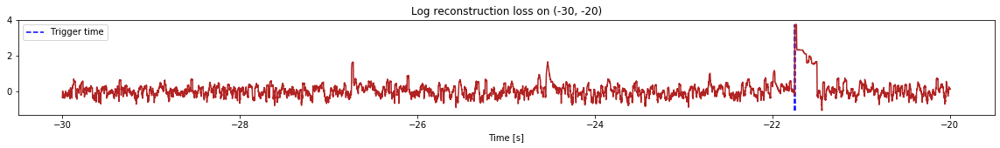

Triggered at:  [-21.7433]
<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


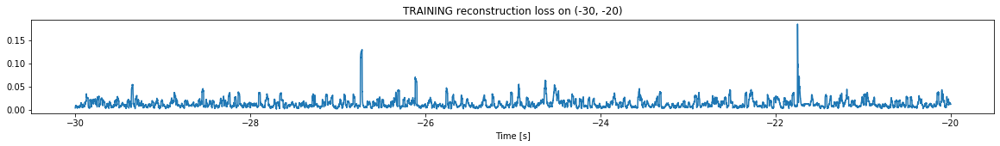

Finished training, median of the log(loss) is:  -1.9827764669563908
Triggering for section:  (-20, -10)
Using this median for triggering: -1.8569302805854822


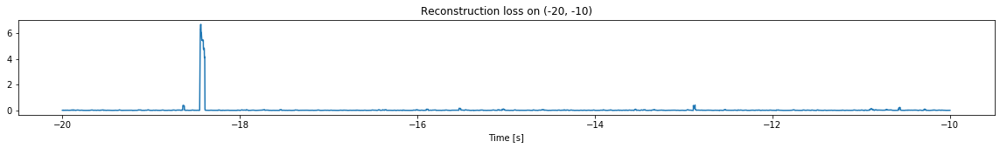

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


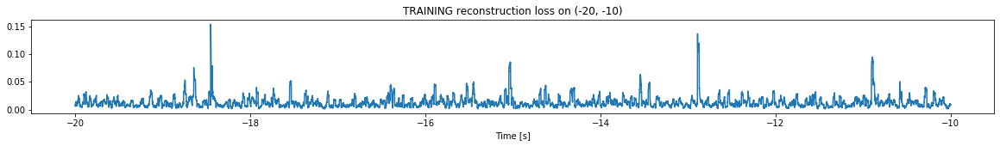

Finished training, median of the log(loss) is:  -1.967573708765297
Triggering for section:  (-10, 0)
Using this median for triggering: -1.9827764669563908


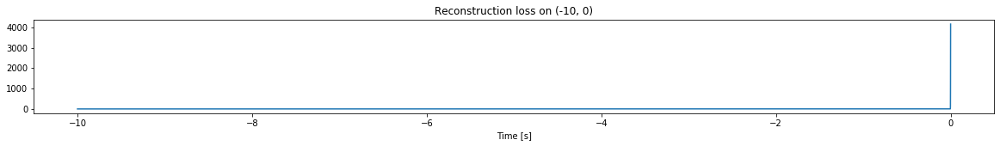

Other trigger time:  []
Their log loss values are:  []


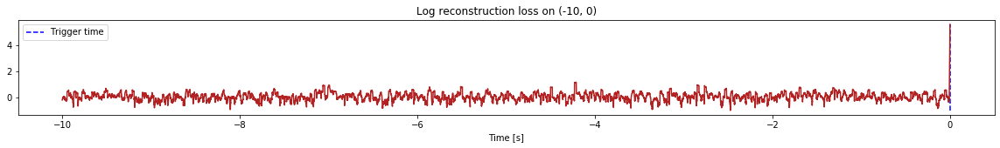

Triggered at:  []
<--------
Finished simulation, all the triggered times are:  [-21.7433]


In [18]:
simulation("./data/Ramp27/", 10, (-70,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (599800, 13)
Flushing input history
Number of sections: 6
Entering sections:  (-60, -50)
-------->
Entering sections:  (-50, -40)
-------->
Training for section:  (None, -50)


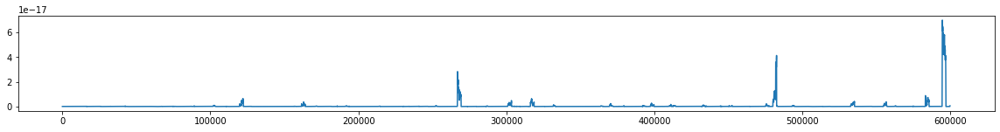

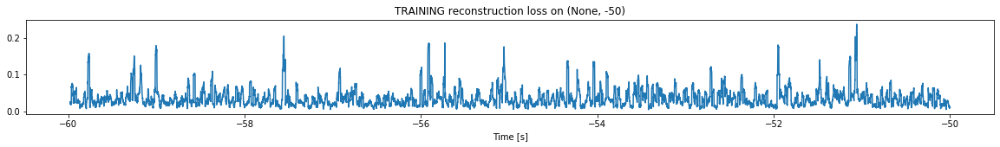

Finished training, median of the log(loss) is:  -1.5170058569874998
<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


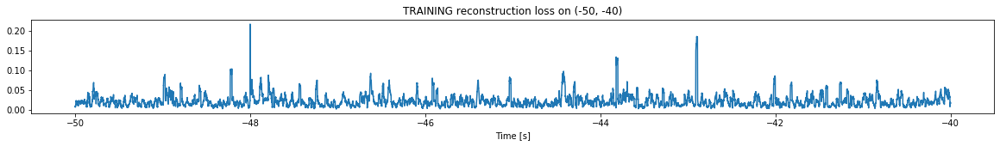

Finished training, median of the log(loss) is:  -1.7133589339248387
Triggering for section:  (-40, -30)
Using this median for triggering: -1.5170058569874998


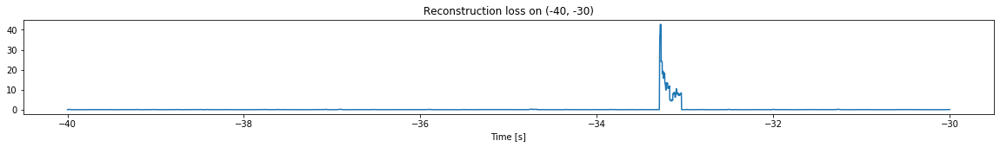

Other trigger time:  [-33.276897]
Their log loss values are:  [3.1481283]


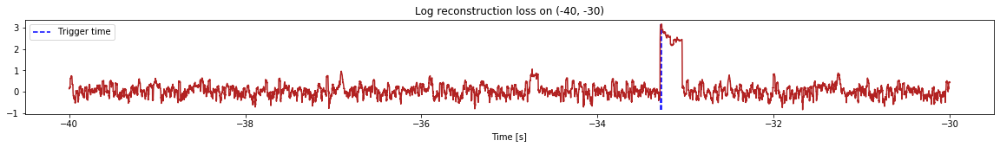

Triggered at:  [-33.276897]
<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


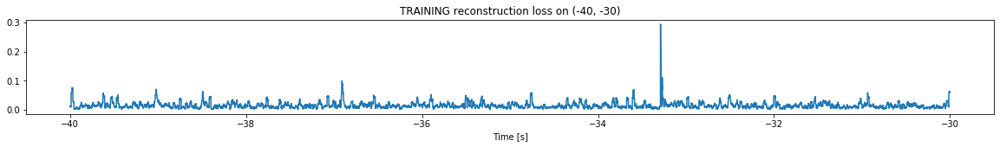

Finished training, median of the log(loss) is:  -1.8632668661017764
Triggering for section:  (-30, -20)
Using this median for triggering: -1.7133589339248387


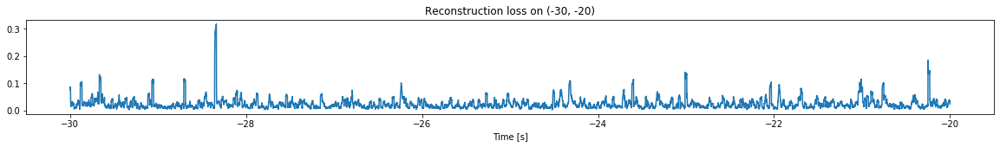

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


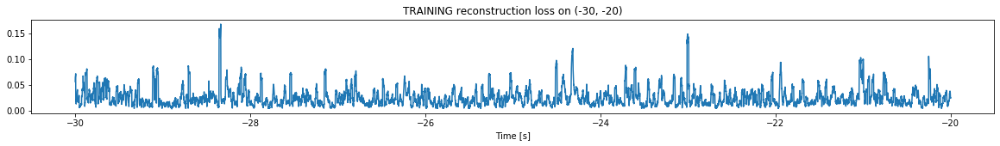

Finished training, median of the log(loss) is:  -1.6723973617025814
Triggering for section:  (-20, -10)
Using this median for triggering: -1.8632668661017764


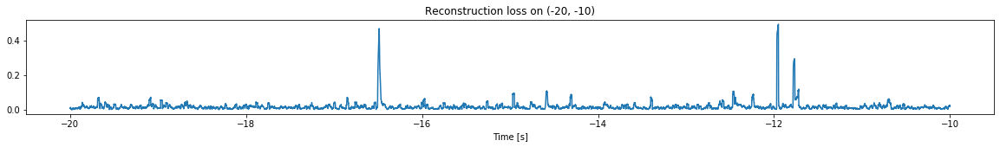

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


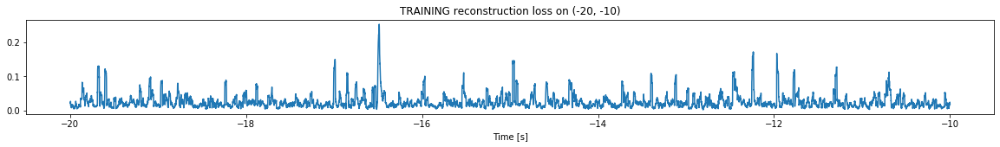

Finished training, median of the log(loss) is:  -1.6937068085260873
Triggering for section:  (-10, 0)
Using this median for triggering: -1.6723973617025814


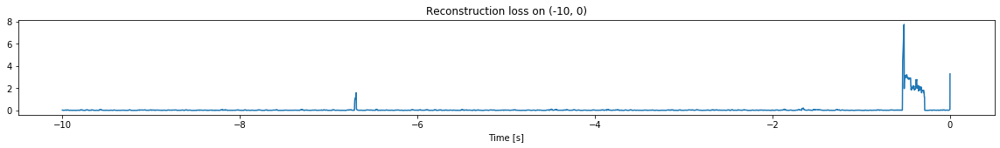

<--------
Finished simulation, all the triggered times are:  [-33.276897]


In [19]:
simulation("./data/Ramp28/", 10, (-60,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (999800, 13)
Flushing input history
Number of sections: 10
Entering sections:  (-100, -90)
-------->
Entering sections:  (-90, -80)
-------->
Training for section:  (None, -90)


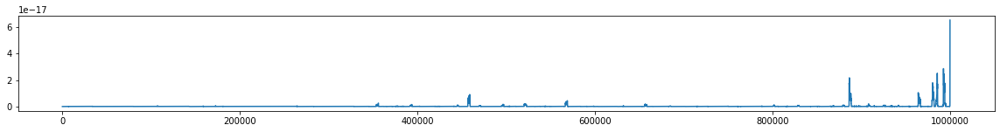

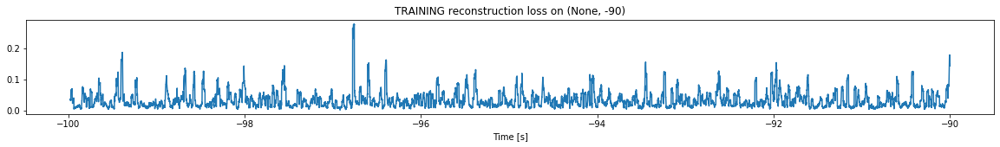

Finished training, median of the log(loss) is:  -1.5516630326233773
<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


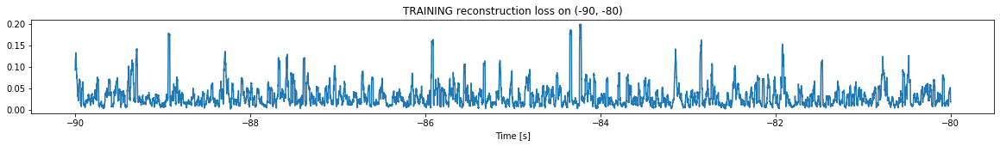

Finished training, median of the log(loss) is:  -1.5872294329854735
Triggering for section:  (-80, -70)
Using this median for triggering: -1.5516630326233773


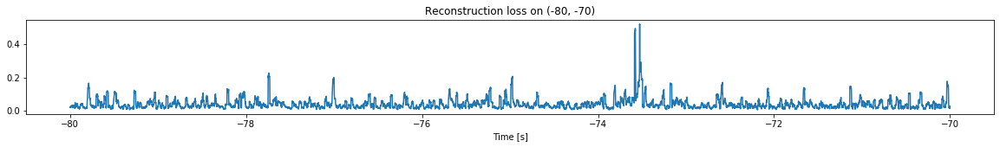

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


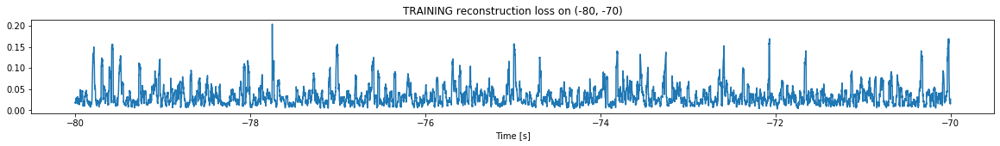

Finished training, median of the log(loss) is:  -1.5571293110981457
Triggering for section:  (-70, -60)
Using this median for triggering: -1.5872294329854735


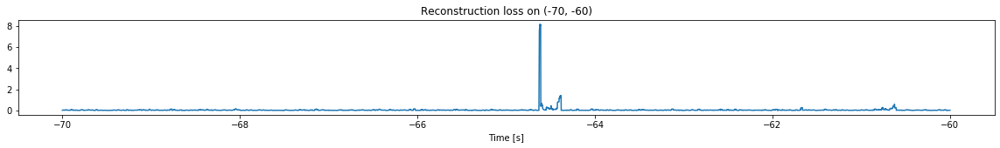

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


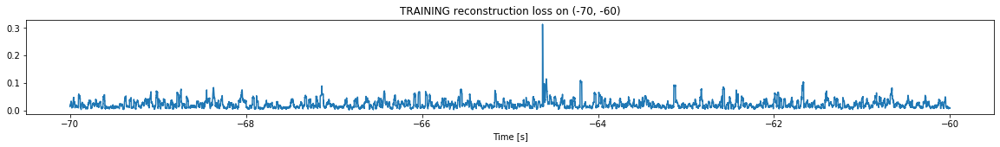

Finished training, median of the log(loss) is:  -1.7251922188409994
Triggering for section:  (-60, -50)
Using this median for triggering: -1.5571293110981457


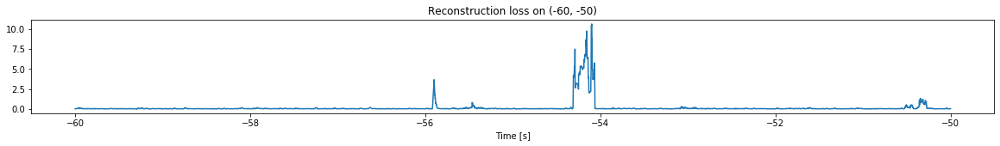

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


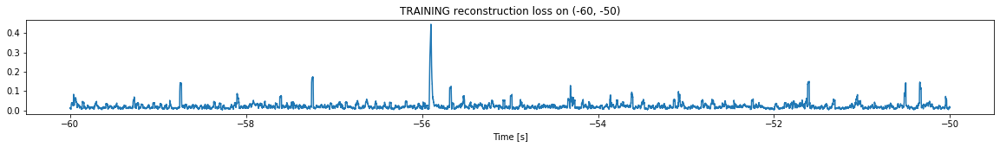

Finished training, median of the log(loss) is:  -1.7475448531203912
Triggering for section:  (-50, -40)
Using this median for triggering: -1.7251922188409994


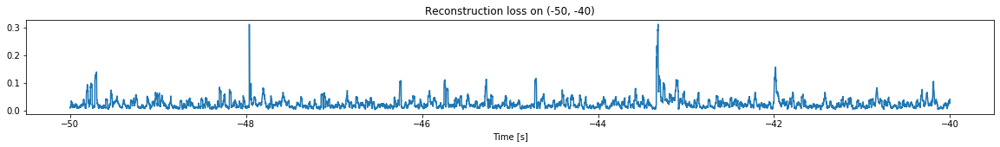

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


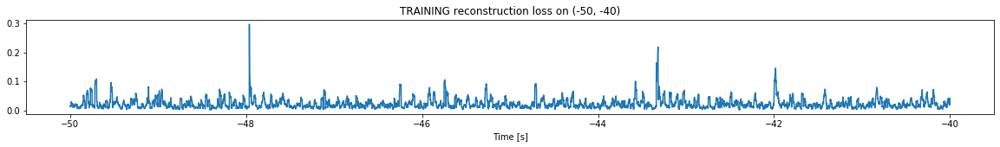

Finished training, median of the log(loss) is:  -1.7156327854317655
Triggering for section:  (-40, -30)
Using this median for triggering: -1.7475448531203912


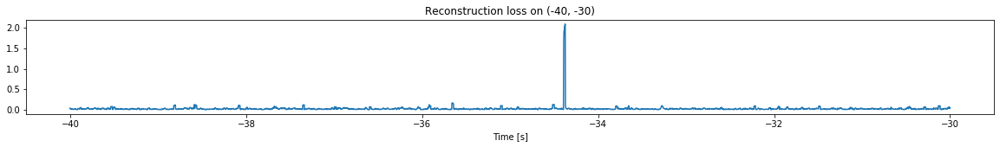

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


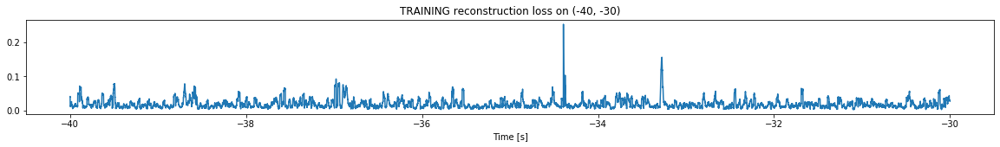

Finished training, median of the log(loss) is:  -1.8020681516873032
Triggering for section:  (-30, -20)
Using this median for triggering: -1.7156327854317655


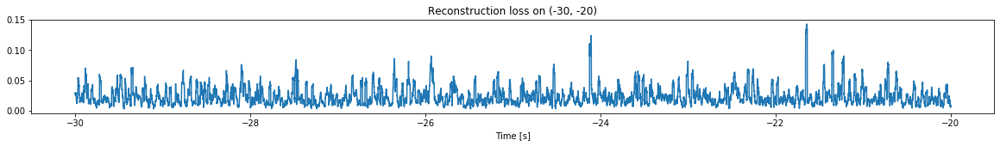

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


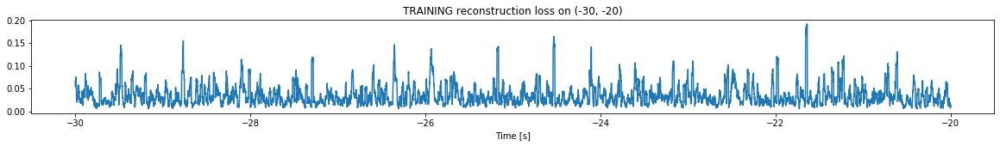

Finished training, median of the log(loss) is:  -1.5260423836144934
Triggering for section:  (-20, -10)
Using this median for triggering: -1.8020681516873032


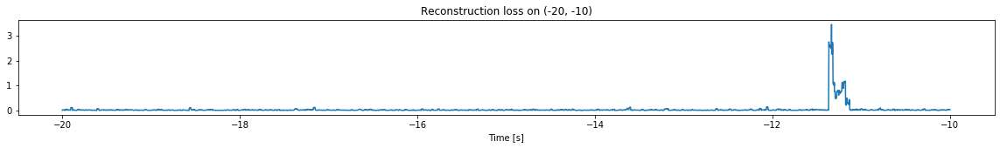

<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


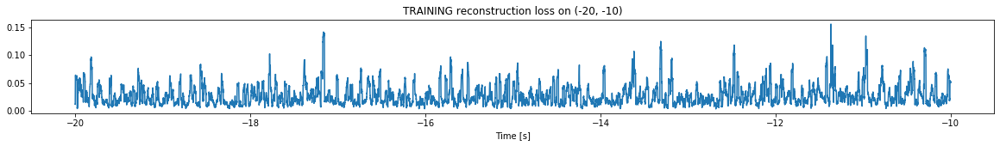

Finished training, median of the log(loss) is:  -1.6441909945515827
Triggering for section:  (-10, 0)
Using this median for triggering: -1.5260423836144934


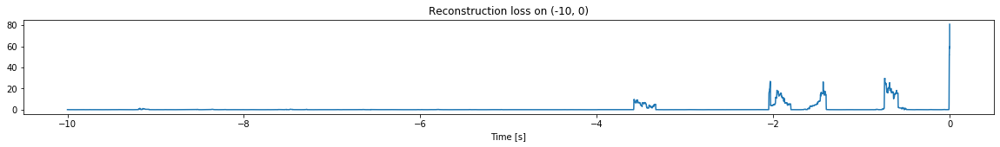

Other trigger time:  [-0.0006]
Their log loss values are:  [3.30020564]


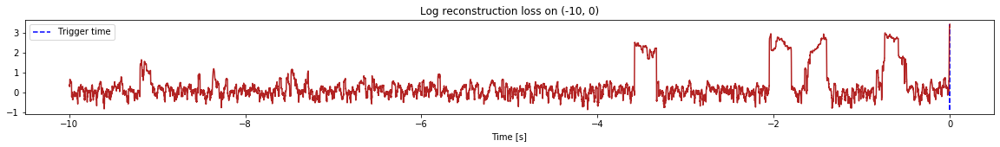

Triggered at:  [-0.00059999997]
<--------
Finished simulation, all the triggered times are:  [-0.00059999997]


In [20]:
simulation("./data/Ramp29/", 10, (-100,0))

Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
Flushing input history
All data's shape:  (1199800, 13)
Flushing input history
Number of sections: 12
Entering sections:  (-120, -110)
-------->
Entering sections:  (-110, -100)
-------->
Training for section:  (None, -110)


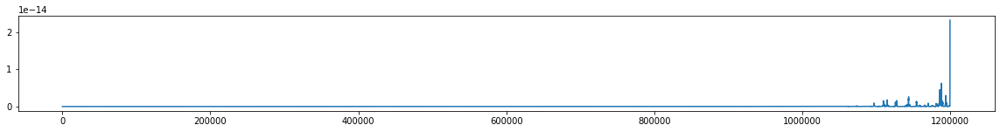

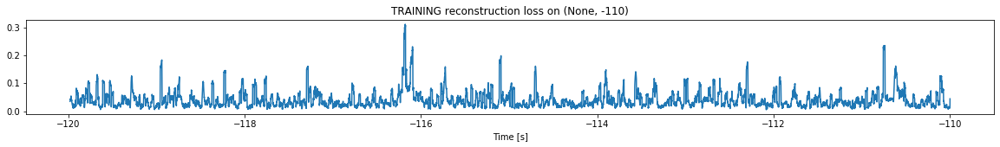

Finished training, median of the log(loss) is:  -1.4846665157603778
<--------
Entering sections:  (-100, -90)
-------->
Training for section:  (-110, -100)


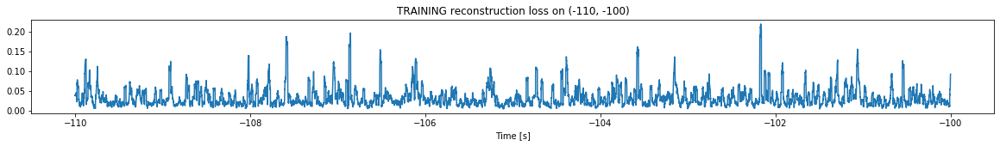

Finished training, median of the log(loss) is:  -1.5675045065981192
Triggering for section:  (-100, -90)
Using this median for triggering: -1.4846665157603778


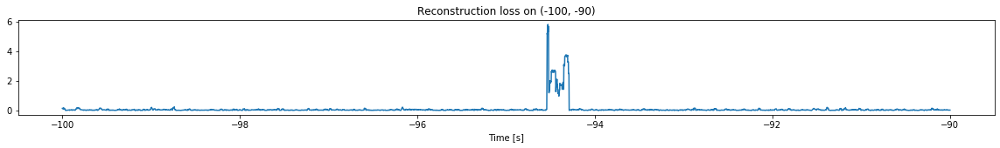

<--------
Entering sections:  (-90, -80)
-------->
Training for section:  (-100, -90)


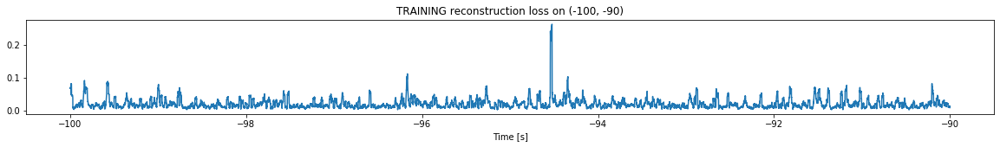

Finished training, median of the log(loss) is:  -1.7665691754237414
Triggering for section:  (-90, -80)
Using this median for triggering: -1.5675045065981192


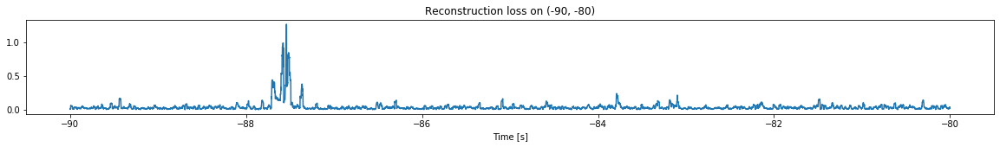

<--------
Entering sections:  (-80, -70)
-------->
Training for section:  (-90, -80)


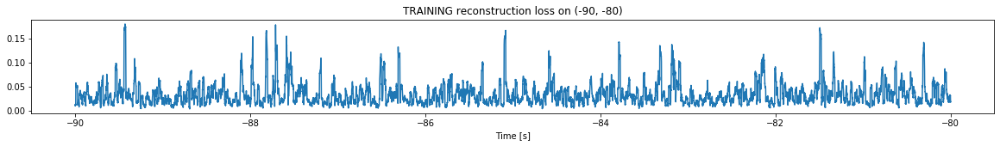

Finished training, median of the log(loss) is:  -1.5473125584466207
Triggering for section:  (-80, -70)
Using this median for triggering: -1.7665691754237414


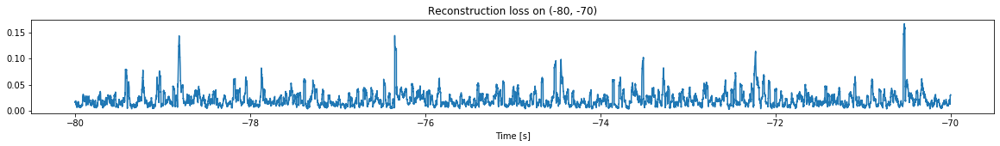

<--------
Entering sections:  (-70, -60)
-------->
Training for section:  (-80, -70)


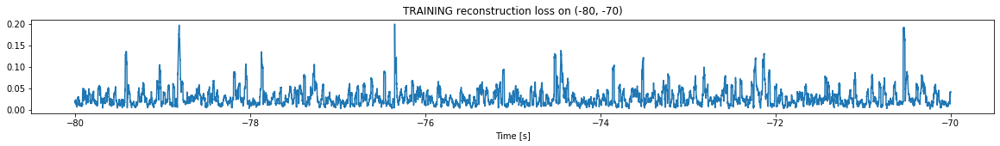

Finished training, median of the log(loss) is:  -1.6132983522435134
Triggering for section:  (-70, -60)
Using this median for triggering: -1.5473125584466207


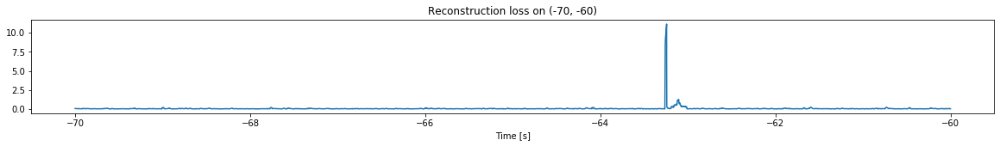

<--------
Entering sections:  (-60, -50)
-------->
Training for section:  (-70, -60)


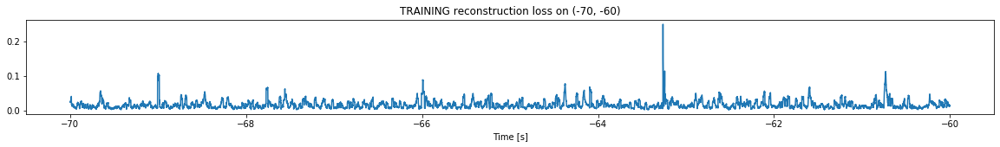

Finished training, median of the log(loss) is:  -1.8541455327983967
Triggering for section:  (-60, -50)
Using this median for triggering: -1.6132983522435134


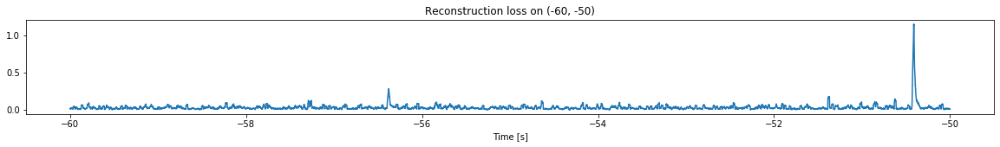

<--------
Entering sections:  (-50, -40)
-------->
Training for section:  (-60, -50)


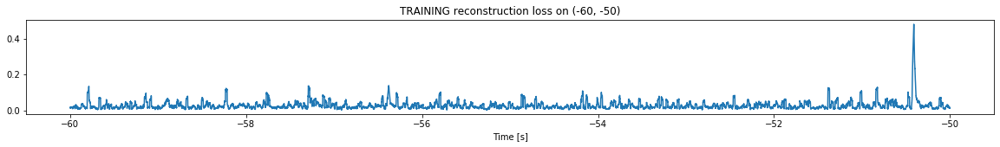

Finished training, median of the log(loss) is:  -1.6768885293297382
Triggering for section:  (-50, -40)
Using this median for triggering: -1.8541455327983967


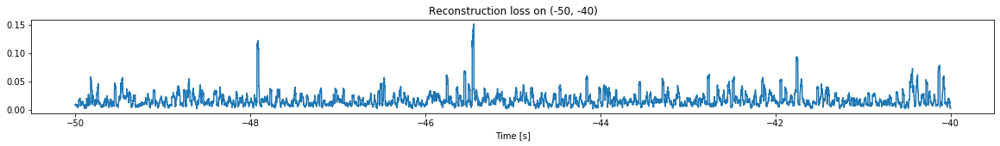

<--------
Entering sections:  (-40, -30)
-------->
Training for section:  (-50, -40)


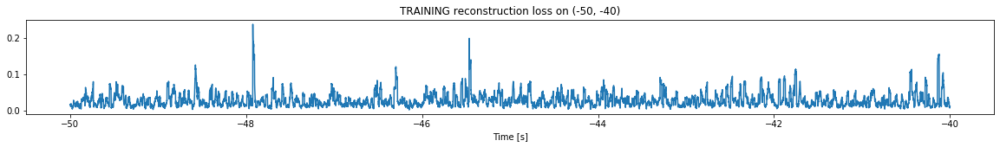

Finished training, median of the log(loss) is:  -1.6080221807354422
Triggering for section:  (-40, -30)
Using this median for triggering: -1.6768885293297382


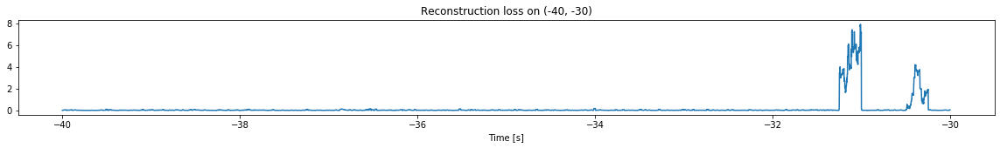

<--------
Entering sections:  (-30, -20)
-------->
Training for section:  (-40, -30)


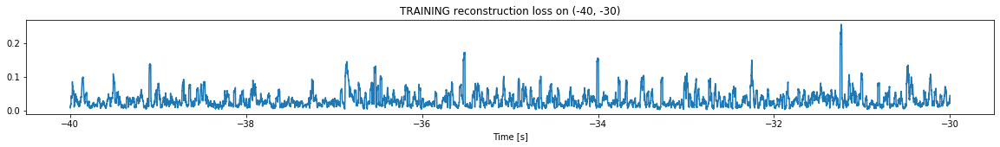

Finished training, median of the log(loss) is:  -1.5758848051482612
Triggering for section:  (-30, -20)
Using this median for triggering: -1.6080221807354422


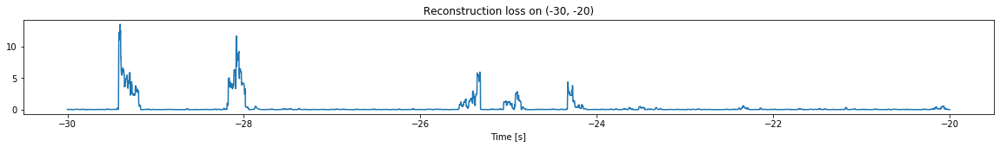

<--------
Entering sections:  (-20, -10)
-------->
Training for section:  (-30, -20)


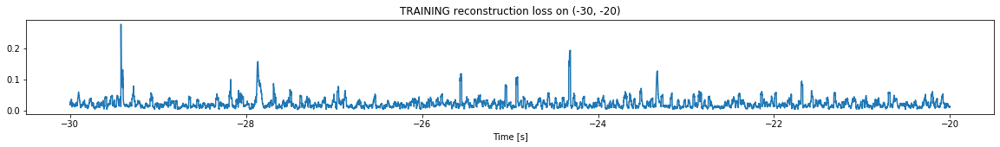

Finished training, median of the log(loss) is:  -1.7275817056832312
Triggering for section:  (-20, -10)
Using this median for triggering: -1.5758848051482612


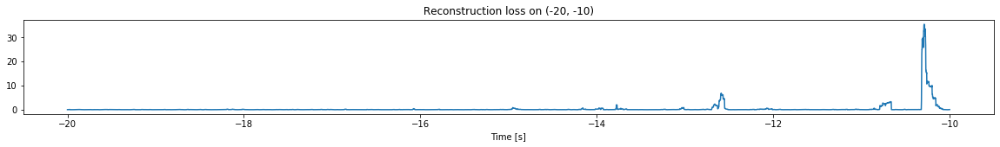

Other trigger time:  [-10.2878]
Their log loss values are:  [3.12690127]


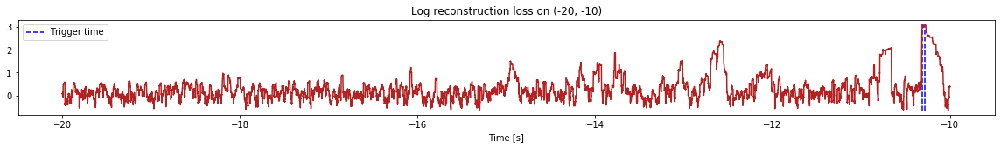

Triggered at:  [-10.2878]
<--------
Entering sections:  (-10, 0)
-------->
Training for section:  (-20, -10)


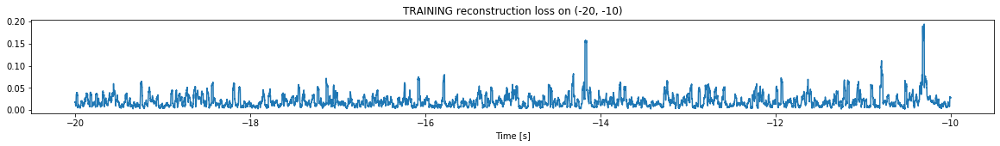

Finished training, median of the log(loss) is:  -1.771485347046089
Triggering for section:  (-10, 0)
Using this median for triggering: -1.7275817056832312


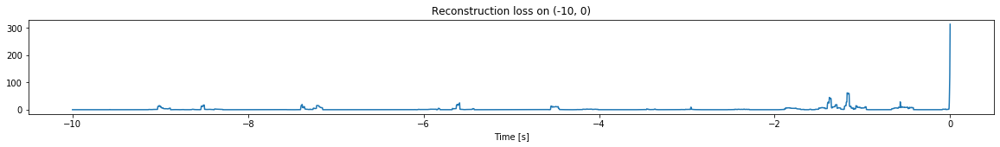

Other trigger time:  [-7.3824 -5.5892 -1.1737 -0.5686]
Their log loss values are:  [3.00815396 3.12791465 3.51760505 3.18647222]


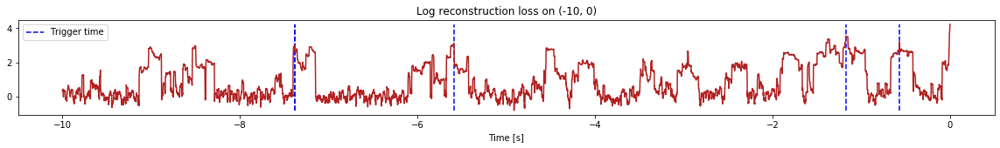

Triggered at:  [-7.3824, -5.5892, -1.1737, -0.5686]
<--------
Finished simulation, all the triggered times are:  [-10.2878, -7.3824, -5.5892, -1.1737, -0.5686]


In [21]:
simulation("./data/Ramp30/", 10, (-120,0))